# Top

In [1]:
%pylab inline
import warnings
warnings.filterwarnings("ignore")

from SCCAF import *

Populating the interactive namespace from numpy and matplotlib


# Preprocessing
[Shekhar, K. et al. Comprehensive Classification of Retinal Bipolar Neurons by Single-Cell Transcriptomics. Cell 166, 1308–1323.e30 (2016)](http://dx.doi.org/10.1016/j.cell.2016.07.054)

In [2]:
import os
os.system("wget ftp://ftp.ncbi.nlm.nih.gov/geo/series/GSE81nnn/GSE81904/suppl/GSE81904_bipolar_data_Cell2016.Rdata.gz")

0

In [3]:
os.system("gunzip GSE81904_bipolar_data_Cell2016.Rdata.gz")

0

In [ ]:
cts = pd.read_csv("ftp://ftp.ncbi.nlm.nih.gov/geo/series/GSE81nnn/GSE81904/suppl/GSE81904_BipolarUMICounts_Cell2016.txt.gz",\
                 sep='\t',compression='gzip',index_col=0)

In [ ]:
phn = pd.read_csv("https://s3.amazonaws.com/scrnaseq-public-datasets/manual-data/shekhar/clust_retinal_bipolar.txt",\
                 sep='\t',index_col=0)

In [ ]:
phn.head(3)

In [ ]:
ad = anndata.AnnData(X=scipy.sparse.csr_matrix(cts.values.T))
ad.obs_names = cts.columns
ad.var_names = cts.index

ad = ad[ad.obs_names.isin(phn.index),:]

# ad.shape

ad.obs = phn.loc[ad.obs_names]
# for col in phn.columns:
#     ad.obs[col] = phn[col]

In [ ]:
ad.raw = sc.pp.log1p(ad,copy=True)

In [ ]:
ad.write("../write/Shekhar.h5")

In [ ]:
ls -lh ../write/Shekhar.h5

## use the batch corrected data

In [3]:
cts = pd.read_csv("Shekhar_corrected.csv",index_col=0)

In [7]:
ad = sc.AnnData(X=cts.values.T)
ad.obs_names = cts.columns
ad.var_names = cts.index

In [8]:
ad = ad[ad.obs_names.isin(phn.index),:]

In [9]:
ad.shape

(27499, 13166)

In [10]:
phn = phn.loc[ad.obs_names]
for col in phn.columns:
    ad.obs[col] = phn[col]

In [11]:
ad.write("../write/Shekhar_corrected.h5")

... storing 'CLUSTER' as categorical
... storing 'SUB-CLUSTER' as categorical


In [12]:
sc.tl.pca(ad)

Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.` This will likely become the Scanpy default in the future.


In [13]:
sc.tl.tsne(ad)

computing tSNE
    using 'X_pca' with n_pcs = 50
    using the 'MulticoreTSNE' package by Ulyanov (2017)
    finished (0:11:18.46) --> added
    'X_tsne', tSNE coordinates (adata.obsm)


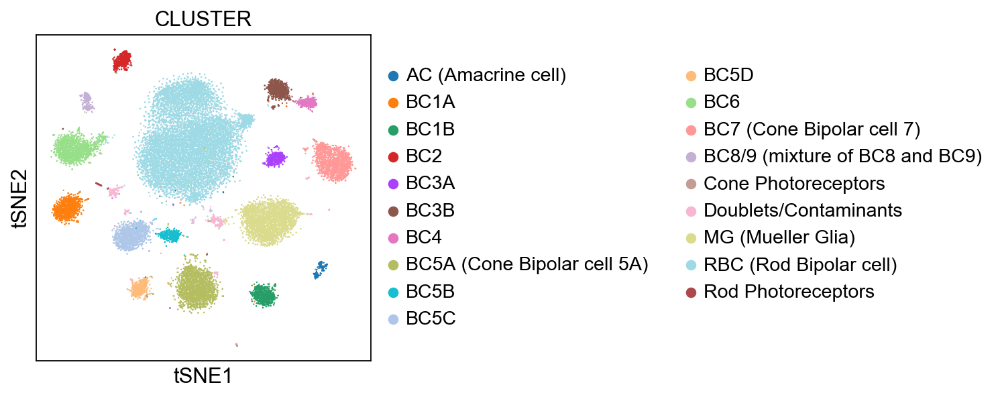

In [14]:
sc.pl.tsne(ad, color=['CLUSTER'])

In [15]:
ad.write("../write/Shekhar_corrected_reg.h5")

In [2]:
ad = sc.read("../write/Shekhar_corrected_reg.h5")
ad.obs['cell'] = ad.obs['CLUSTER']
ad1 = ad[~ad.obs['CLUSTER'].str.startswith("Doublet"),:]

> We need to remove the doublets from clustering. Doublets will be removed by QC. 

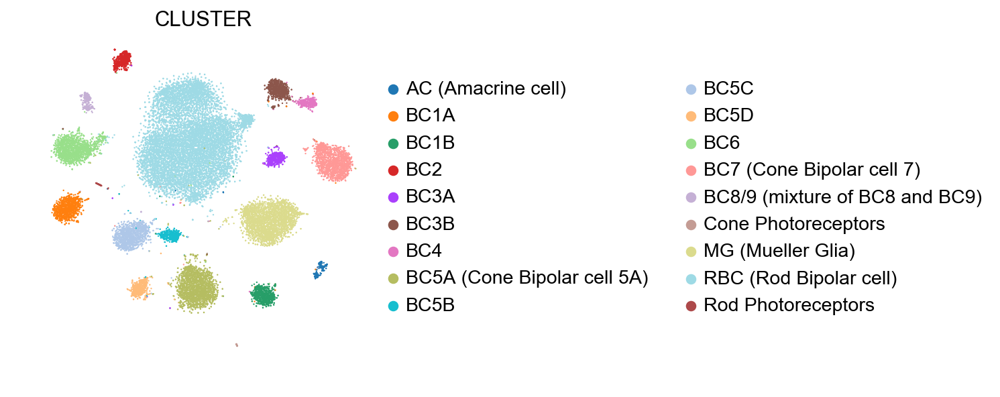

In [4]:
sc.pl.tsne(ad1, color=['CLUSTER'],frameon=False)

# Assessment of the 'ground truth' clustering

Mean CV accuracy: 0.9641
Accuracy on the training set: 1.0000
Accuracy on the hold-out set: 0.9795


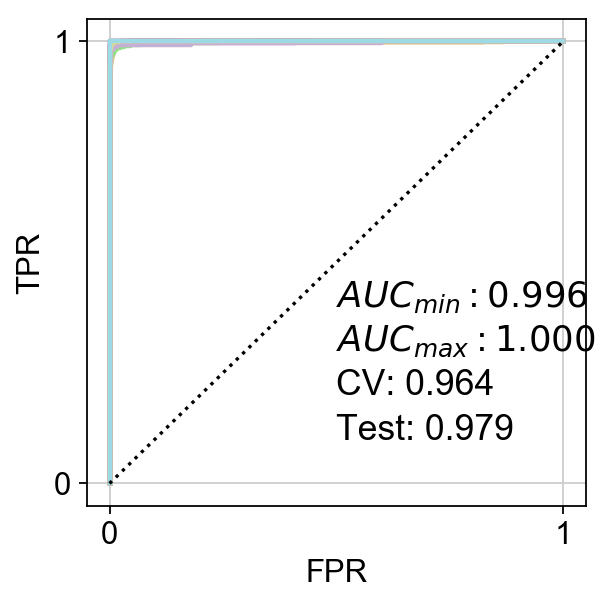

In [4]:
y_prob, y_pred, y_test, clf, cvsm, acc = SCCAF_assessment(ad1.X, ad1.obs['cell'],n=100)
aucs = plot_roc(y_prob, y_test, clf, cvsm=cvsm, acc=acc)
plt.show()

> The accuracy is 98.6%

In [5]:
ad.write("../write/Shekhar_reg.h5")
ad1.write("../write/Shekhar_reg1.h5")

# recovery of the ground truth

In [6]:
ad = sc.read("../write/Shekhar_reg1.h5")

## half split

In [7]:
ad.obs['cell'] = ad.obs['CLUSTER']
df = pd.DataFrame(ad.obs['cell'])
df.index = np.arange(ad.shape[0])
df.columns = ['class']

In [8]:
c_idx = df.groupby('class').apply(lambda x: x.sample(frac=0.5)).index.get_level_values(None)

d_idx = ~np.isin(np.arange(ad.shape[0]), c_idx)

ad1 = ad[c_idx,:]

ad2 = ad[d_idx,:]

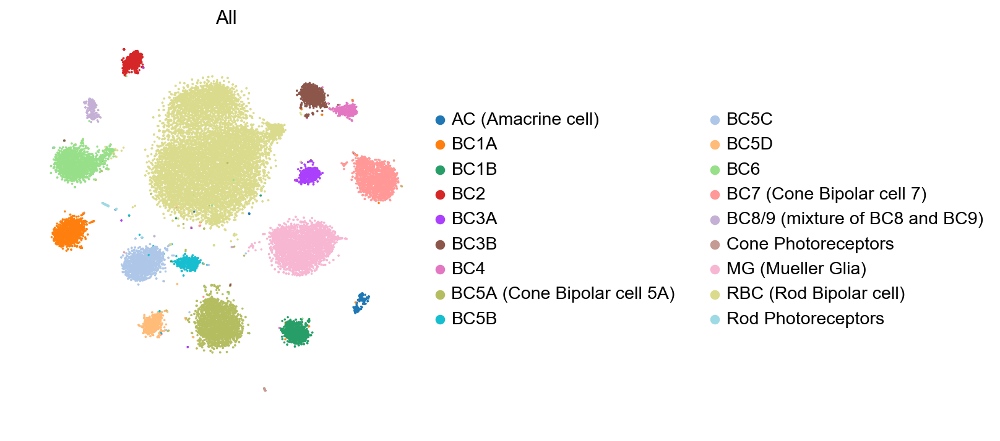

In [9]:
figsize(5,5)
sc.pl.tsne(ad, color=['cell'],frameon=False,size=10,title='All')

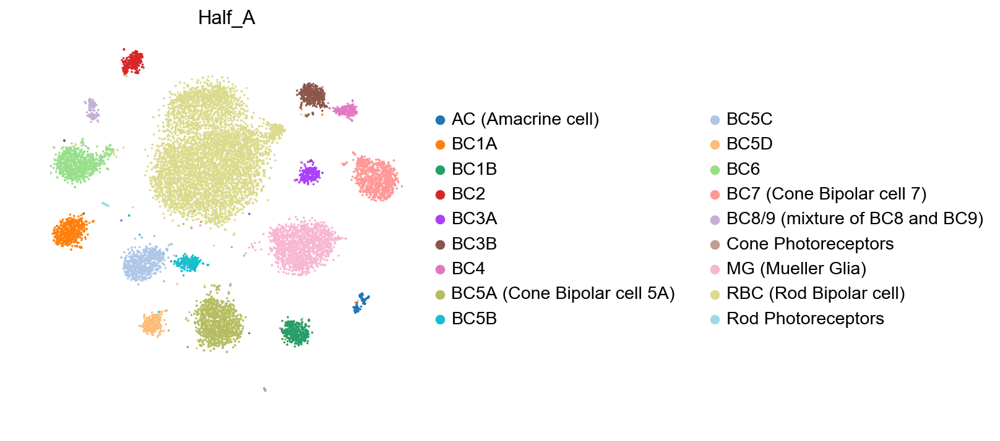

In [10]:
figsize(5,5)
sc.pl.tsne(ad1, color=['cell'],frameon=False,size=10,title='Half_A')

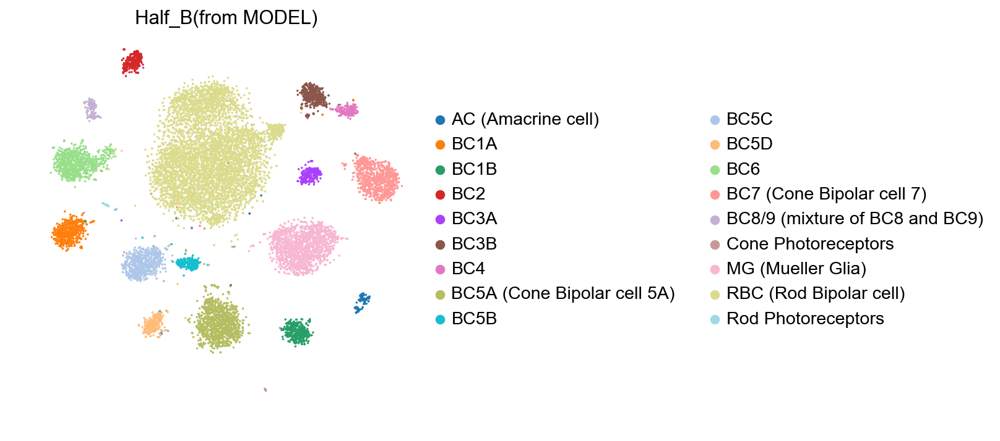

In [11]:
sc.pl.tsne(ad2, color=['cell'],frameon=False,size=10, title='Half_B(from MODEL)')

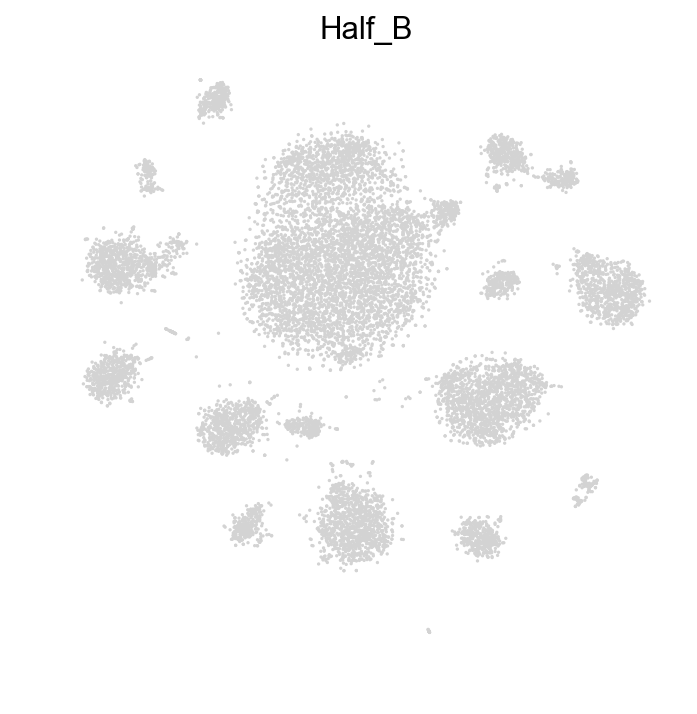

In [12]:
sc.pl.tsne(ad2,frameon=False,title='Half_B')

> Louvain clustering: widely used in single cell data analysis, such as Seurat and Scanpy. It aims to maximize the modularity, but is not essentially related to biology.

In [14]:
sc.pp.neighbors(ad)

sc.tl.louvain(ad, resolution=0.3)
ad.obs['louvain_res0.3'] = ad.obs['louvain']
sc.tl.louvain(ad, resolution=0.5)
ad.obs['louvain_res0.5'] = ad.obs['louvain']
sc.tl.louvain(ad, resolution=1.0)
ad.obs['louvain_res1.0'] = ad.obs['louvain']
sc.tl.louvain(ad, resolution=1.5)
ad.obs['louvain_res1.5'] = ad.obs['louvain']

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished (0:00:12.43) --> added to `.uns['neighbors']`
    'distances', weighted adjacency matrix
    'connectivities', weighted adjacency matrix
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:05.56) --> found 16 clusters and added
    'louvain', the cluster labels (adata.obs, categorical)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:06.86) --> found 19 clusters and added
    'louvain', the cluster labels (adata.obs, categorical)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:06.59) --> found 21 clusters and added
    'louvain', the cluster labels (adata.obs, categorical)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:05.60) --> found 22 clusters and added
    'louvain', the cluster labels (adata.obs, categorical)


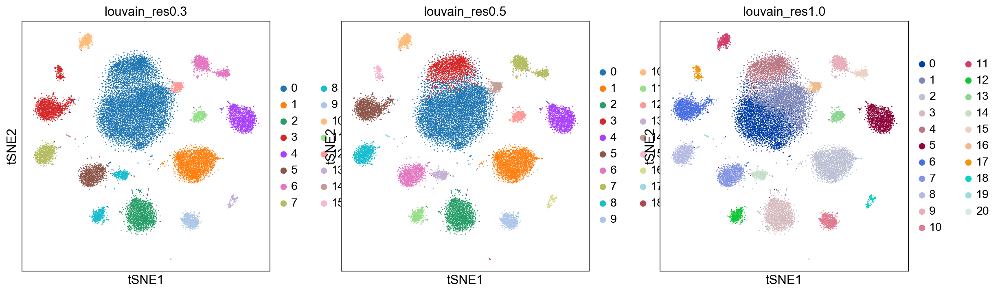

In [15]:
sc.pl.tsne(ad,color=['louvain_res0.3','louvain_res0.5','louvain_res1.0',])

> According to the ground truth clustering, only the resolution 3.5 does not include under-clustering. the start status of the SCCAF clustering optimization needs to be selected manually. 

> the start status of the clustering which includes over-clustering is assigned as "%s_Round0"%prefix. When we use "L1" as prefix (by default), the start clustering is L1_Round0. We need to assign the clustering assignment to L1_Round0. 

In [16]:
ad.obs['L1_Round0'] = ad.obs['louvain_res1.0']

> This is the total optimization. It aims to achieve a total self-projection accuracy of the whole dataset to higher than min_acc. Here we set min_acc=0.96, means that the optimization will not stop unless the min_acc is better than 96%. 

start_iter: 0
R1norm_cutoff: 0.500000
R2norm_cutoff: 0.050000
Accuracy: 0.000000
Round1 ...
Mean CV accuracy: 0.9457
Accuracy on the training set: 0.9751
Accuracy on the hold-out set: 0.8979


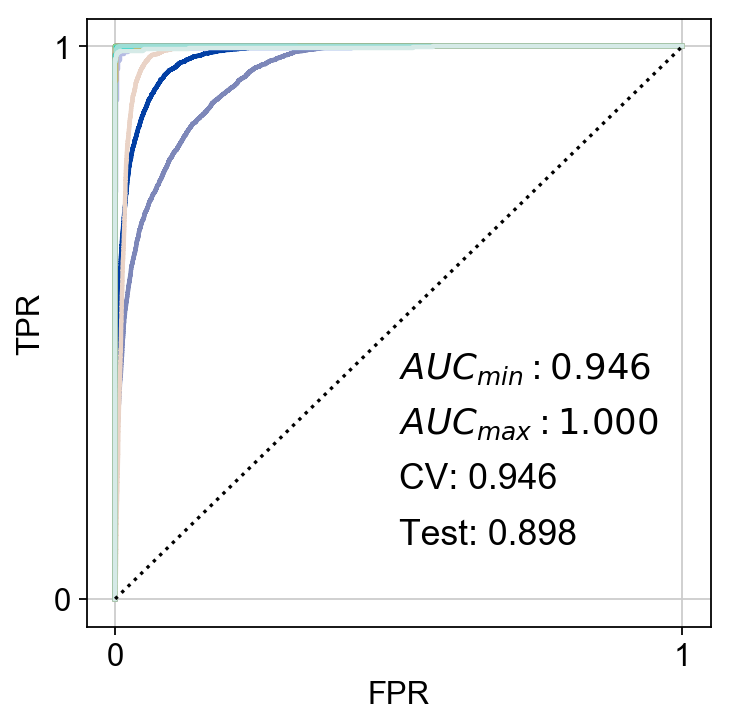

... storing 'L1_Round0_self-projection' as categorical


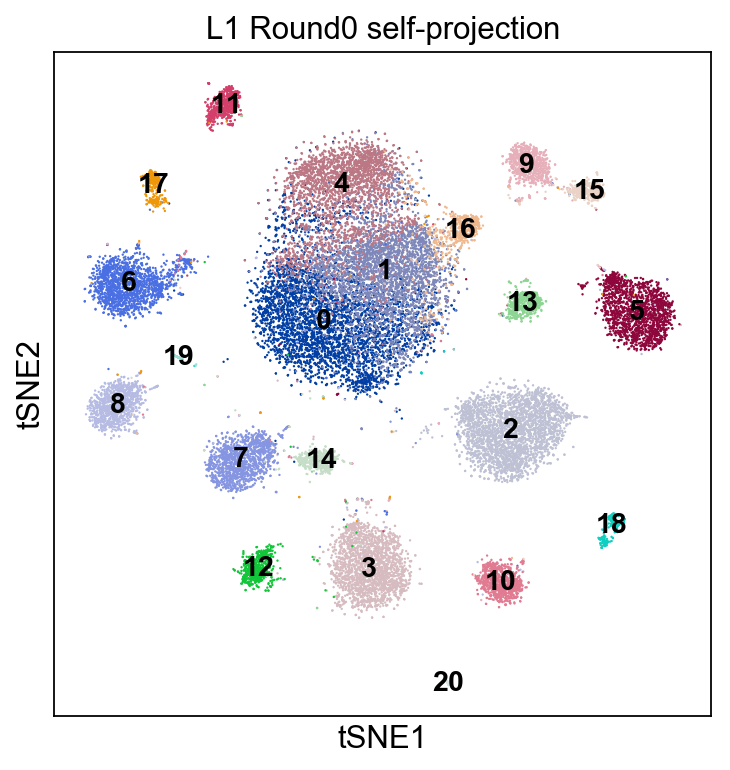

Accuracy on the training set: 0.9761
Accuracy on the hold-out set: 0.9054
Accuracy on the training set: 0.9787
Accuracy on the hold-out set: 0.8951
Max R1mat: 0.582143
Max R2mat: 0.034319


<Figure size 400x400 with 0 Axes>

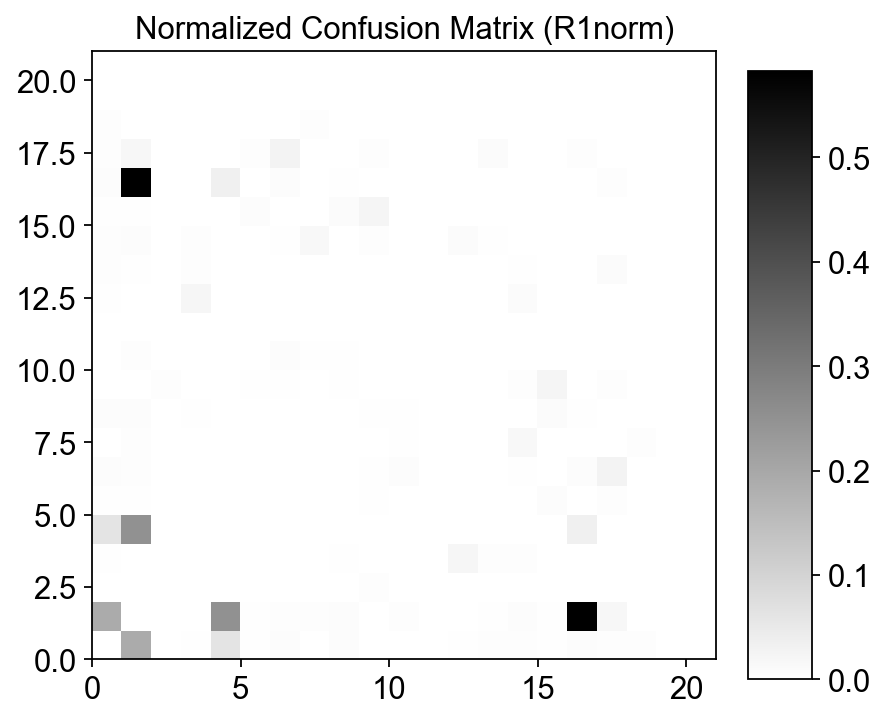

<Figure size 400x400 with 0 Axes>

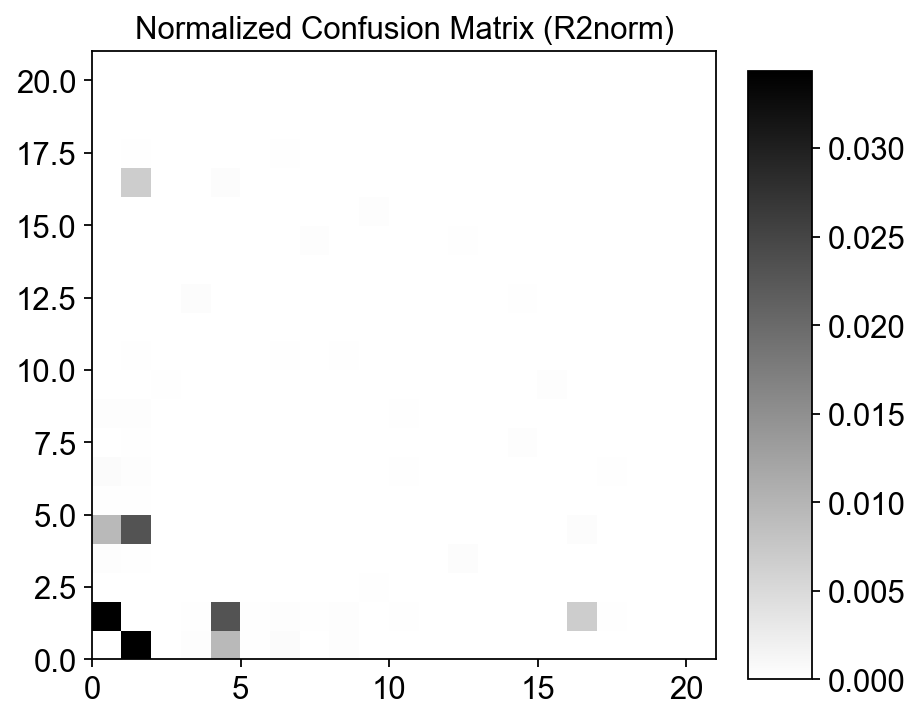

... storing 'L1_Round1' as categorical


IGRAPH U-W- 21 2 --
+ attr: weight (e)
+ edges:
1--16 1--16


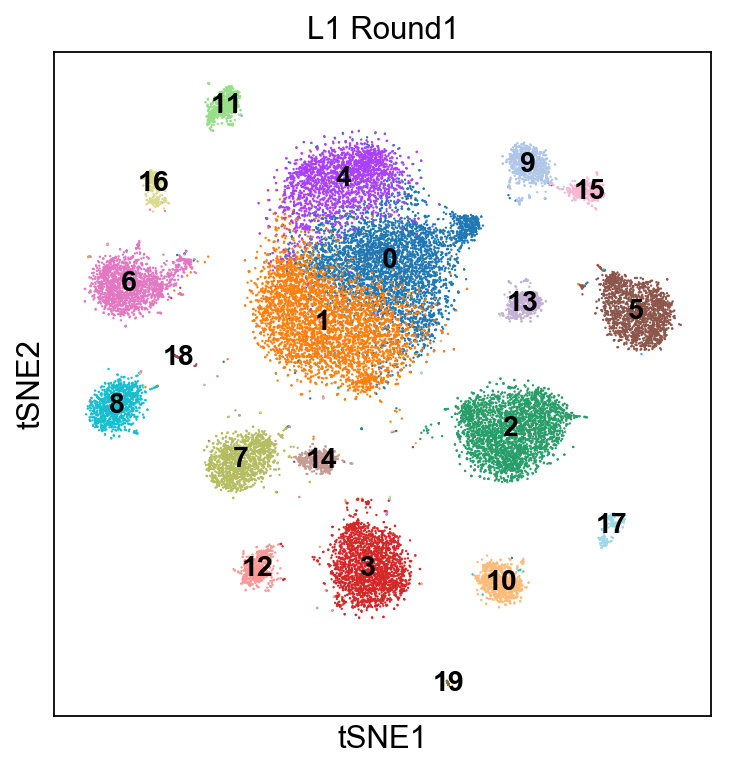

Round2 ...
Mean CV accuracy: 0.9647
Accuracy on the training set: 0.9914
Accuracy on the hold-out set: 0.9089


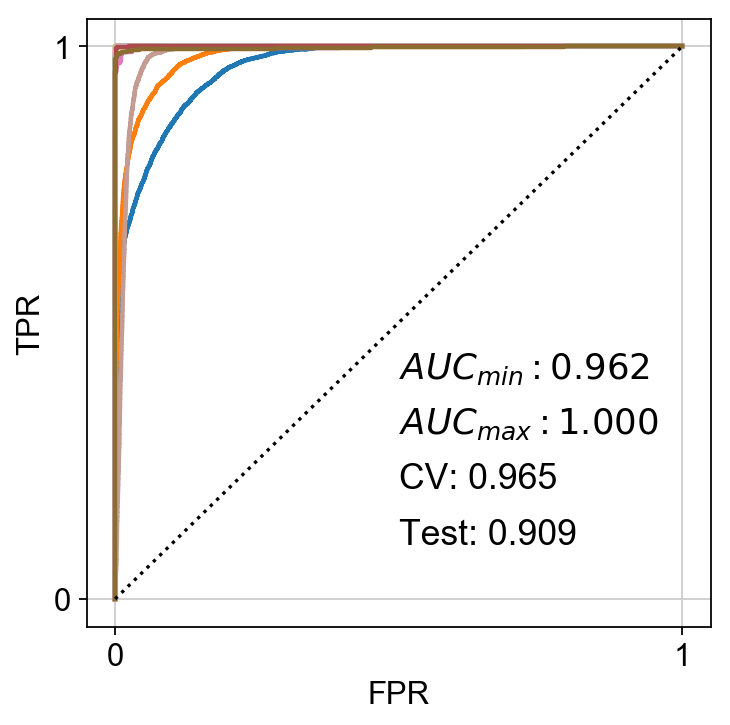

... storing 'L1_Round1_self-projection' as categorical


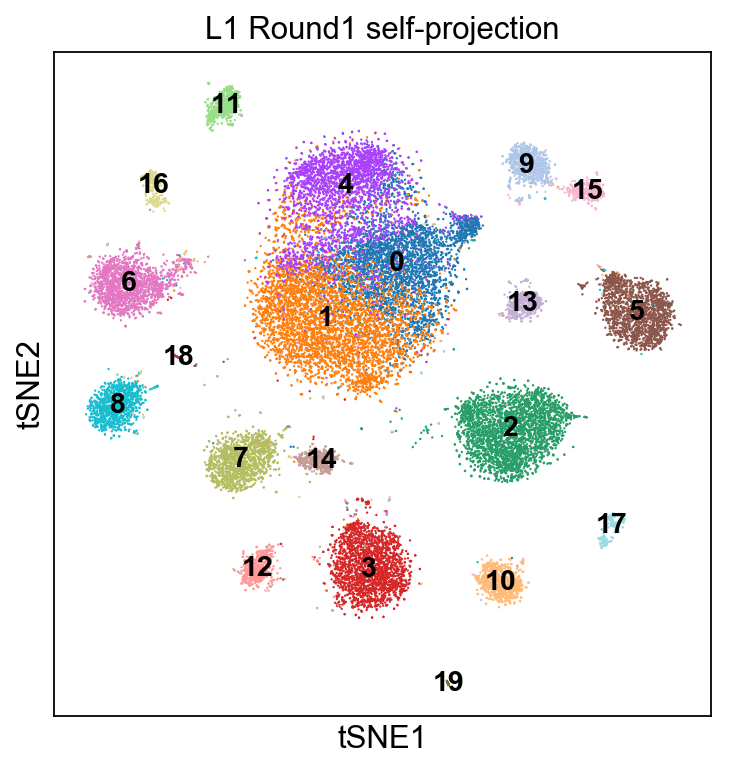

Accuracy on the training set: 0.9797
Accuracy on the hold-out set: 0.9189
Accuracy on the training set: 0.9797
Accuracy on the hold-out set: 0.9064
Max R1mat: 0.249865
Max R2mat: 0.034227


<Figure size 400x400 with 0 Axes>

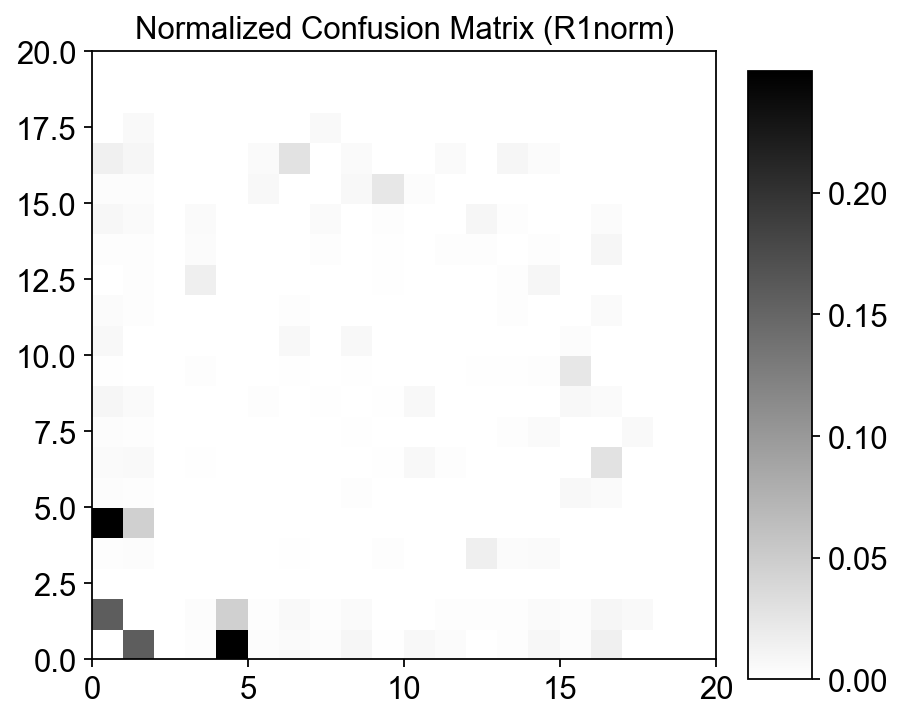

<Figure size 400x400 with 0 Axes>

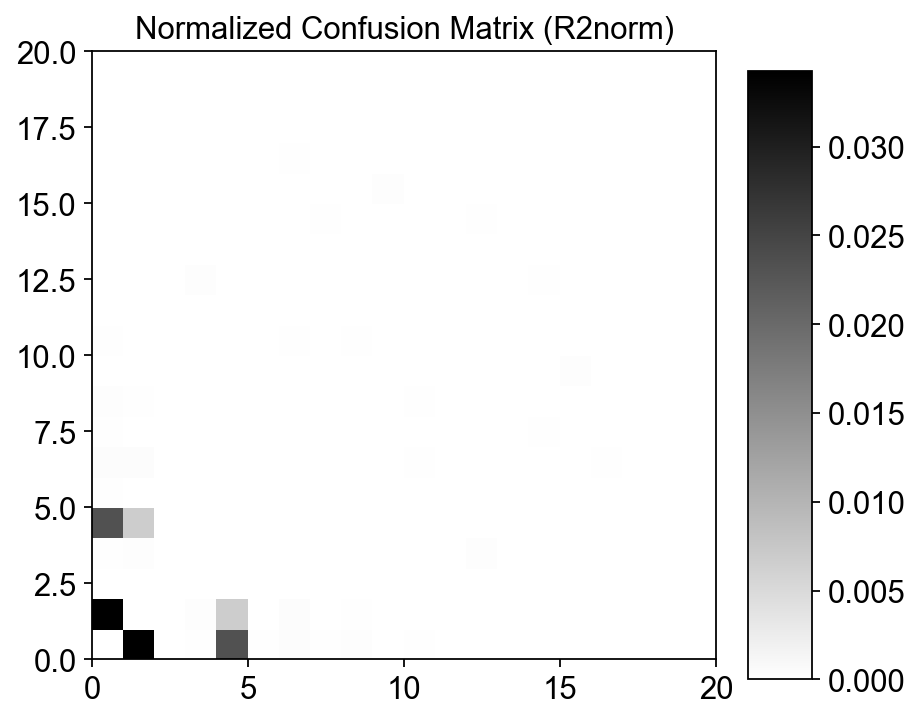

IGRAPH U-W- 20 0 --
+ attr: weight (e)
Converged!
m1: 0.249865
m2: 0.034227
Accuracy: 0.906370
start_iter: 1
R1norm_cutoff: 0.239865
R2norm_cutoff: 0.033227
Accuracy: 0.906370
Round2 ...
Mean CV accuracy: 0.9636
Accuracy on the training set: 0.9840
Accuracy on the hold-out set: 0.9068


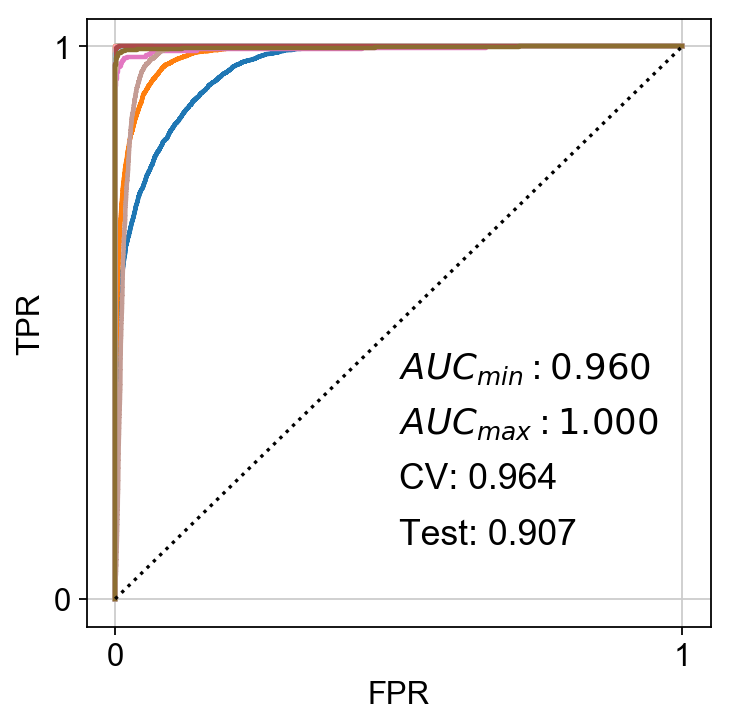

... storing 'L1_Round1_self-projection' as categorical


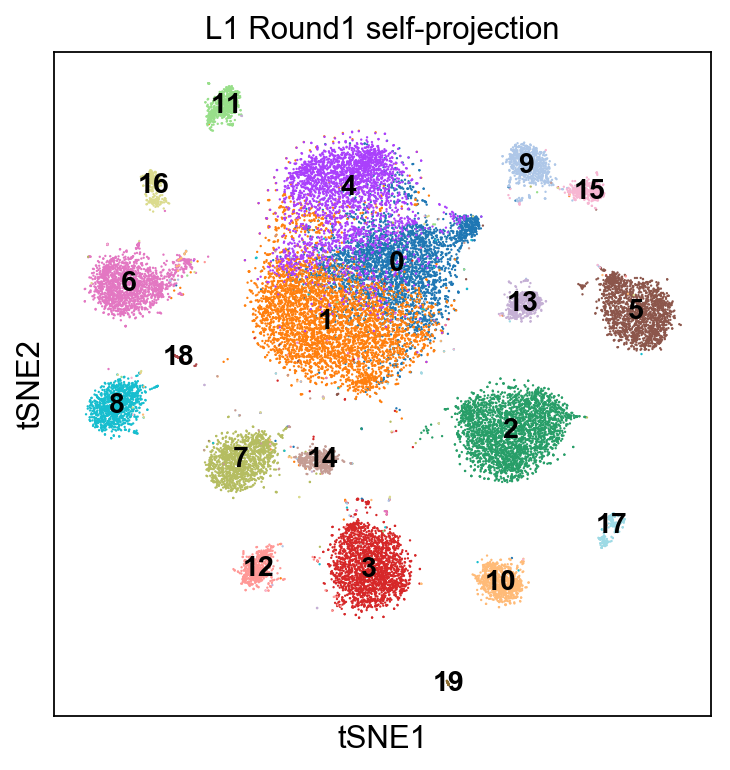

Accuracy on the training set: 0.9807
Accuracy on the hold-out set: 0.9046
Accuracy on the training set: 0.9850
Accuracy on the hold-out set: 0.9072
Max R1mat: 0.366542
Max R2mat: 0.035910


<Figure size 400x400 with 0 Axes>

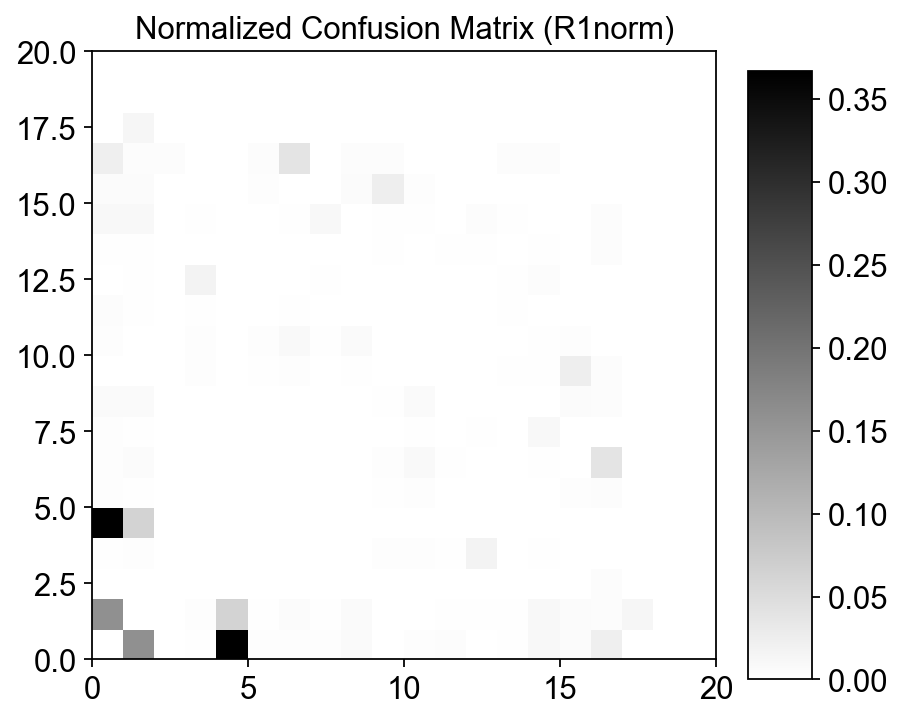

<Figure size 400x400 with 0 Axes>

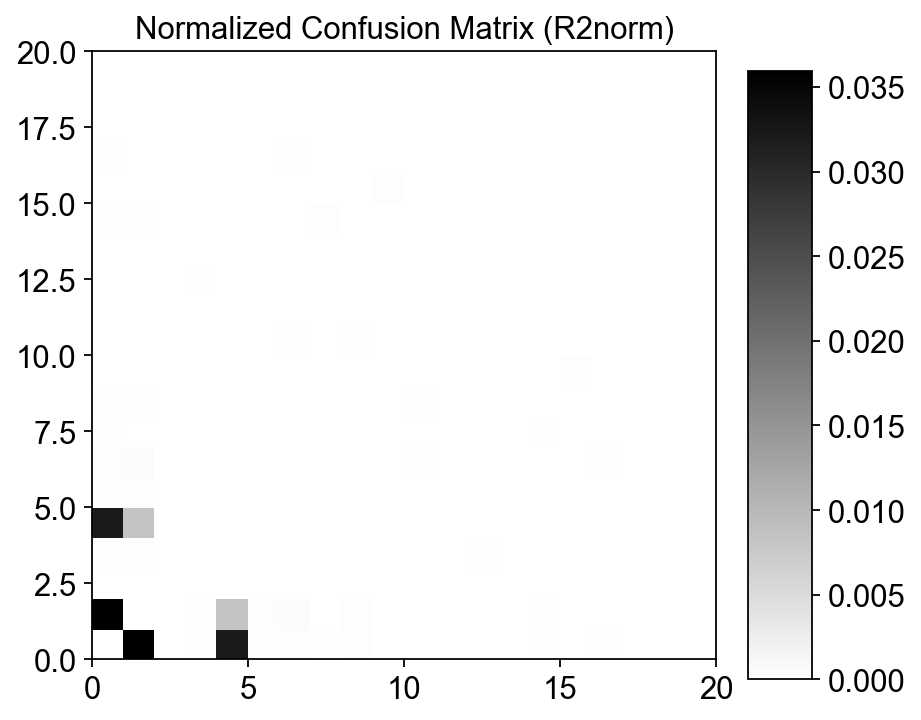

... storing 'L1_Round2' as categorical


IGRAPH U-W- 20 4 --
+ attr: weight (e)
+ edges:
0--1 0--4 0--1 0--4


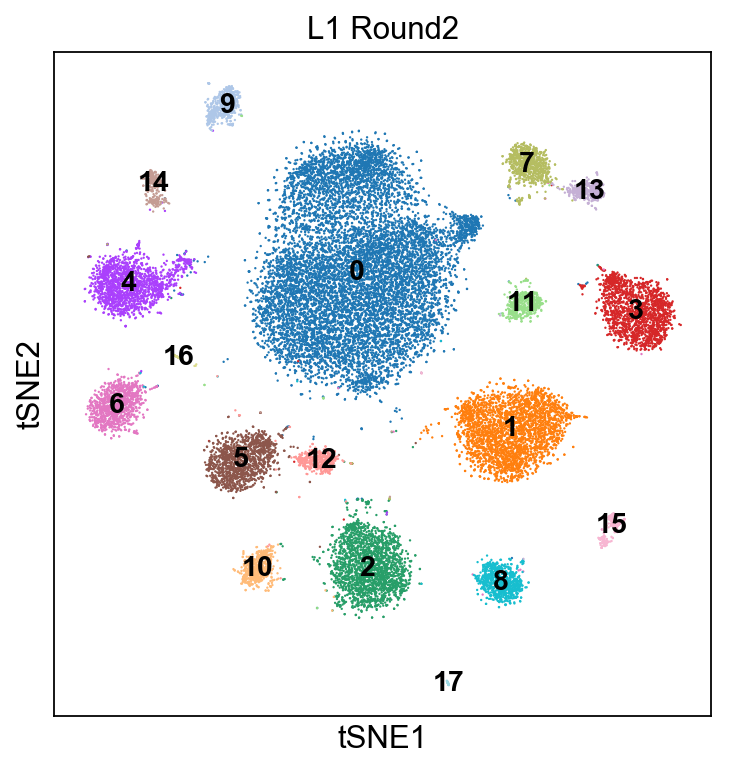

Round3 ...
Mean CV accuracy: 0.9868
Accuracy on the training set: 0.9982
Accuracy on the hold-out set: 0.9906


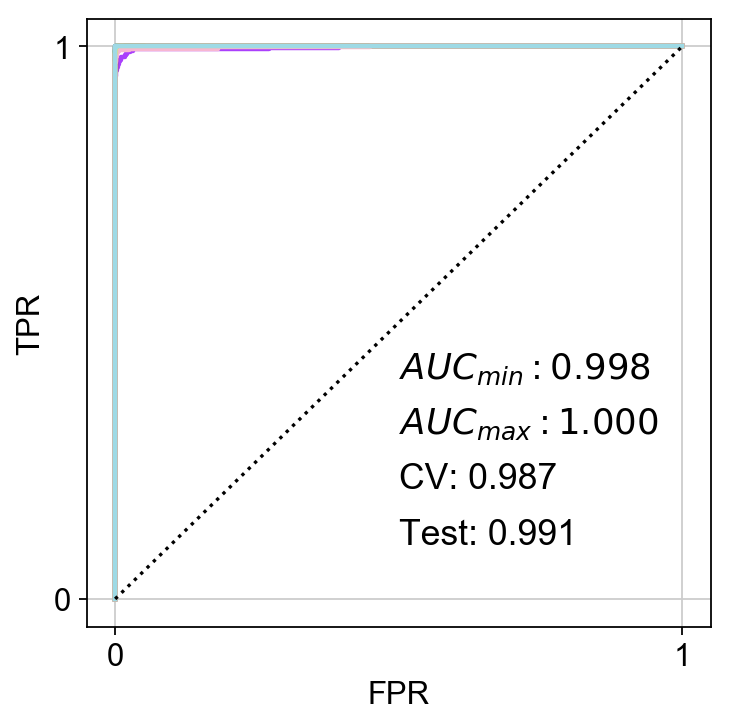

... storing 'L1_Round2_self-projection' as categorical


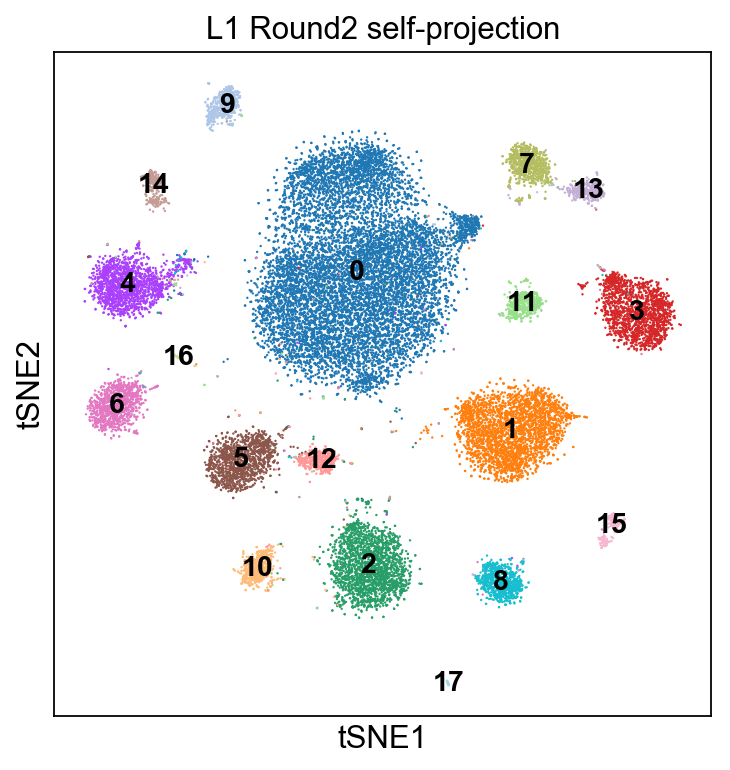

Accuracy on the training set: 0.9970
Accuracy on the hold-out set: 0.9907
Accuracy on the training set: 0.9994
Accuracy on the hold-out set: 0.9898
Max R1mat: 0.034146
Max R2mat: 0.000480


<Figure size 400x400 with 0 Axes>

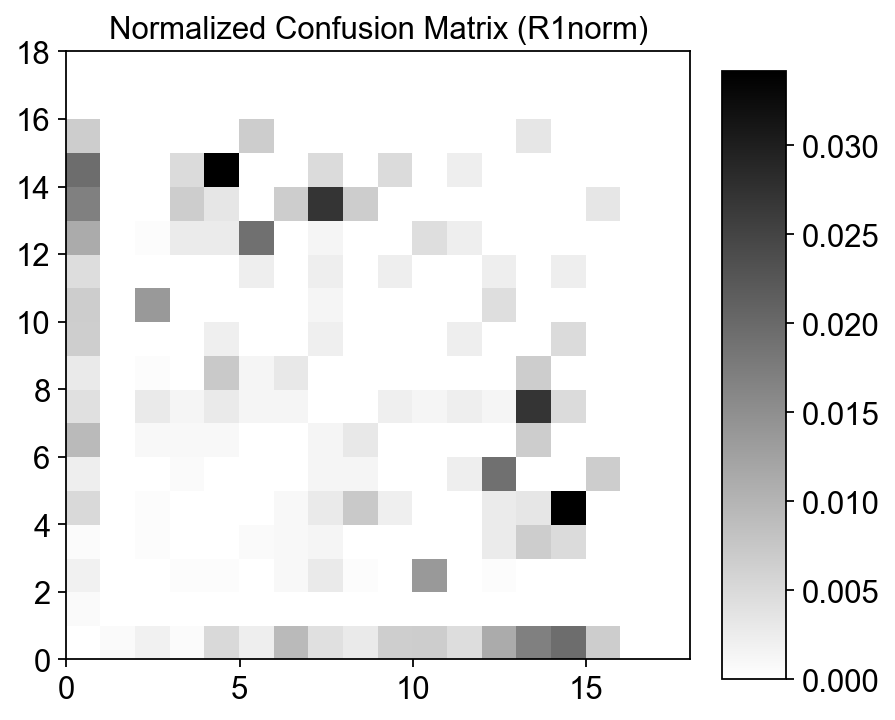

<Figure size 400x400 with 0 Axes>

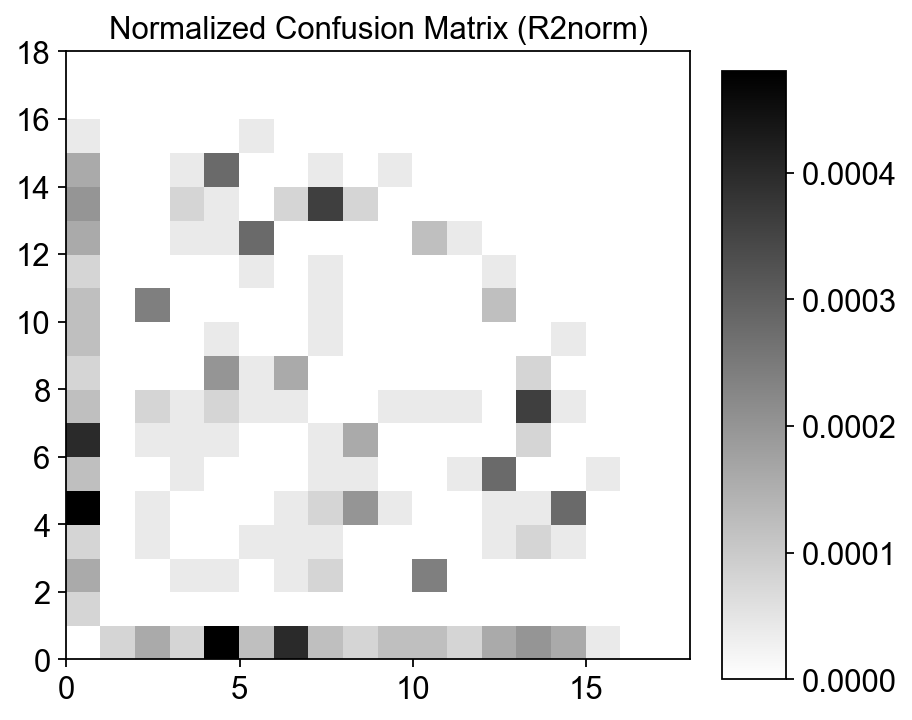

IGRAPH U-W- 18 0 --
+ attr: weight (e)
Converged!
m1: 0.034146
m2: 0.000480
Accuracy: 0.989825


In [17]:
SCCAF_optimize_all(min_acc=0.96, ad=ad, use='pca', basis='tsne')

> The results of SCCAF_optimize is stored in "%s_result"%prefix. When prefix is "L1", the result is in anndata.obs['L1_result'].

> same number of cell clusters achieved.

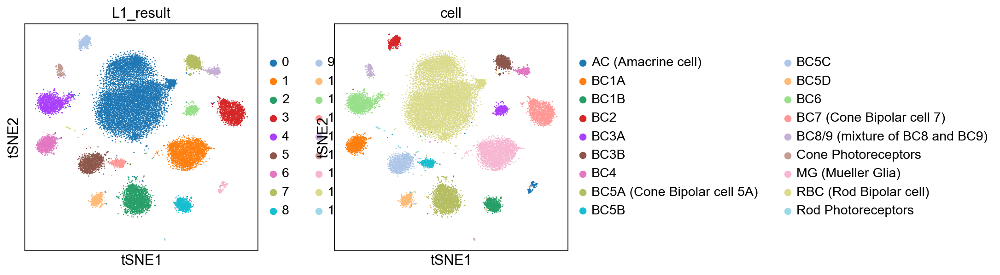

In [18]:
figsize(4,4)
sc.pl.tsne(ad, color=['L1_result','cell'])

In [19]:
ad.write("../write/Shekhar_reg1.h5")

Mean CV accuracy: 0.9563
Accuracy on the training set: 1.0000
Accuracy on the hold-out set: 0.9796


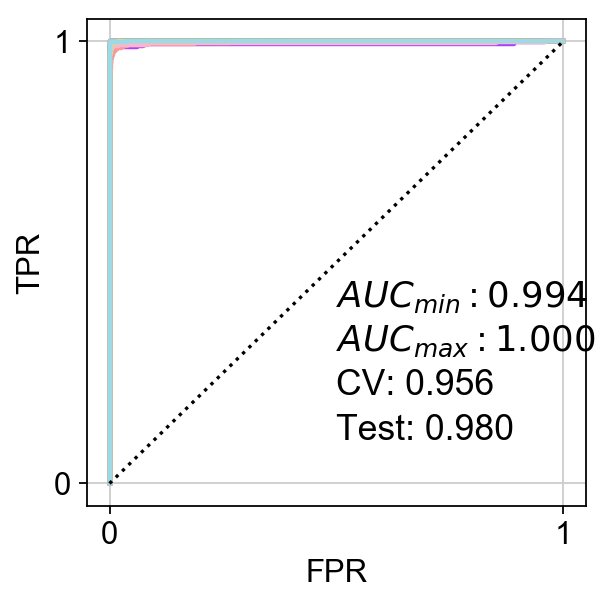

In [20]:
y_prob, y_pred, y_test, clf, cvsm, acc = SCCAF_assessment(ad.X, ad.obs['L1_result'],n=100)
aucs = plot_roc(y_prob, y_test, clf, cvsm=cvsm, acc=acc)
plt.show()

> the result shows identical self-projection accuracy.

# start with 3.5

In [35]:
ad = sc.read("../write/Shekhar_reg1.h5")

In [37]:
sc.tl.louvain(ad, resolution=3.5)

In [53]:
ad.uns['louvain'] = color_long+default_64

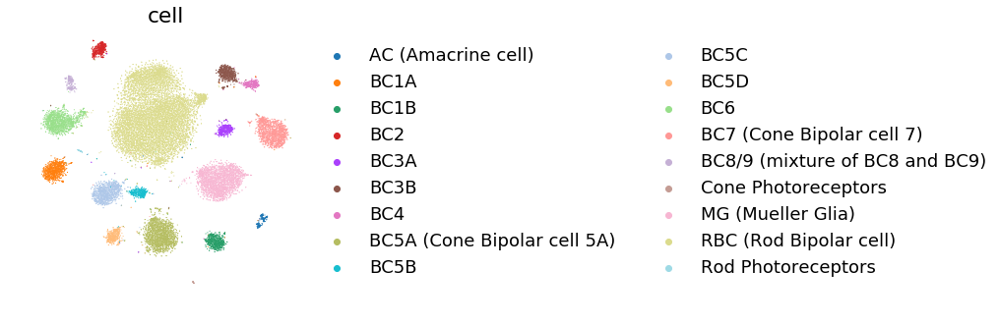

In [55]:
sc.pl.tsne(ad, color='cell',frameon=False)

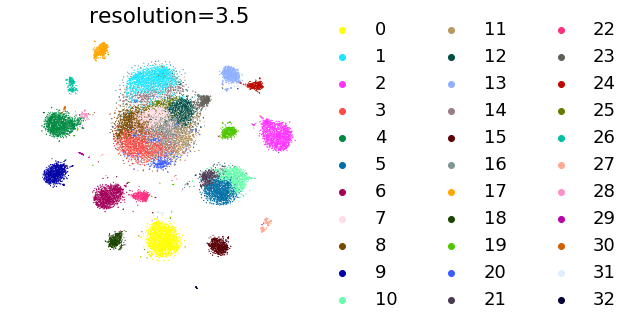

In [54]:
sc.pl.tsne(ad, color='louvain',title='resolution=3.5',frameon=False)

In [41]:
ad.obs['louvain_res3.5'] = ad.obs['louvain']

In [42]:
ad.obs['L1_Round0'] = ad.obs['louvain_res3.5']

start_iter: 0
R1norm_cutoff: 0.500000
R2norm_cutoff: 0.050000
Accuracy: 0.000000
Round1 ...
Mean CV accuracy: 0.8235
Accuracy on the training set: 0.8986
Accuracy on the hold-out set: 0.8279


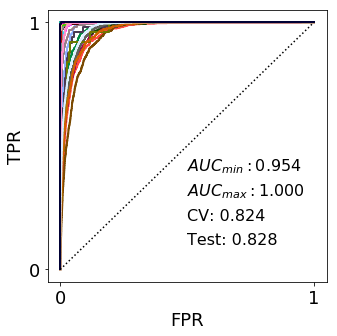

... storing 'L1_Round0_self-projection' as categorical


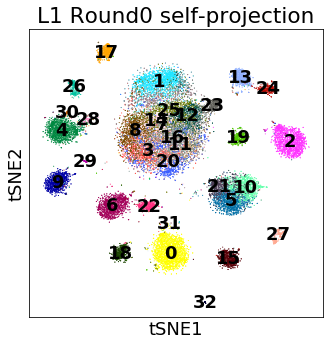

Accuracy on the training set: 0.8963
Accuracy on the hold-out set: 0.8233
Accuracy on the training set: 0.9030
Accuracy on the hold-out set: 0.8177
Max R1mat: 0.429348
Max R2mat: 0.010174


<Figure size 360x360 with 0 Axes>

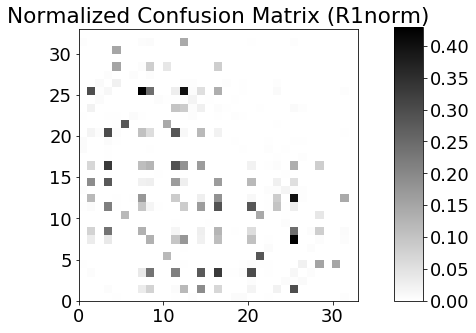

<Figure size 360x360 with 0 Axes>

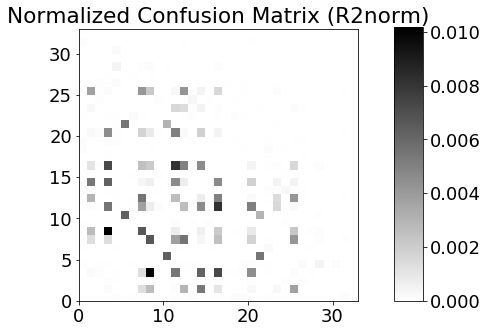

IGRAPH U-W- 33 0 --
+ attr: weight (e)
Converged!
m1: 0.429348
m2: 0.010174
Accuracy: 0.817694
start_iter: 0
R1norm_cutoff: 0.419348
R2norm_cutoff: 0.009174
Accuracy: 0.817694
Round1 ...
Mean CV accuracy: 0.8195
Accuracy on the training set: 0.8976
Accuracy on the hold-out set: 0.8291


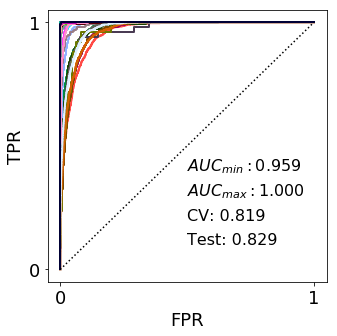

... storing 'L1_Round0_self-projection' as categorical


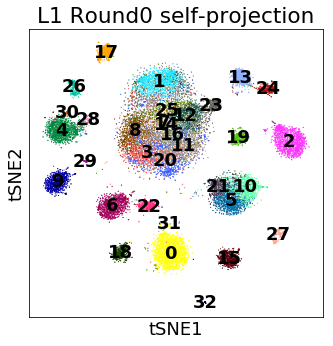

Accuracy on the training set: 0.9047
Accuracy on the hold-out set: 0.8258
Accuracy on the training set: 0.9030
Accuracy on the hold-out set: 0.8181
Max R1mat: 0.411243
Max R2mat: 0.008064


<Figure size 360x360 with 0 Axes>

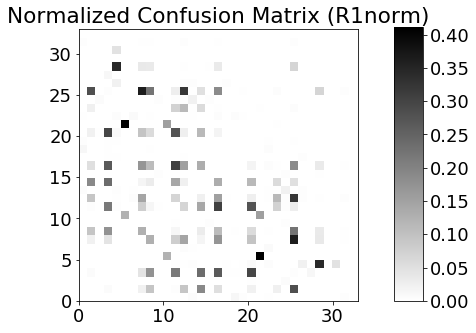

<Figure size 360x360 with 0 Axes>

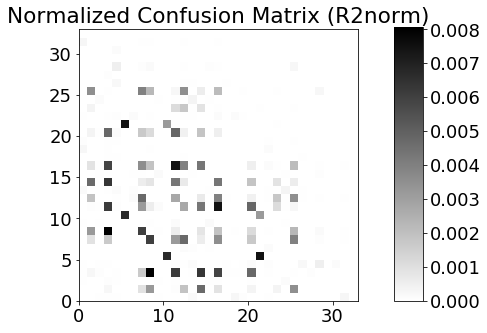

IGRAPH U-W- 33 0 --
+ attr: weight (e)
Converged!
m1: 0.411243
m2: 0.008064
Accuracy: 0.818113
start_iter: 0
R1norm_cutoff: 0.401243
R2norm_cutoff: 0.007064
Accuracy: 0.818113
Round1 ...
Mean CV accuracy: 0.8252
Accuracy on the training set: 0.9037
Accuracy on the hold-out set: 0.8305


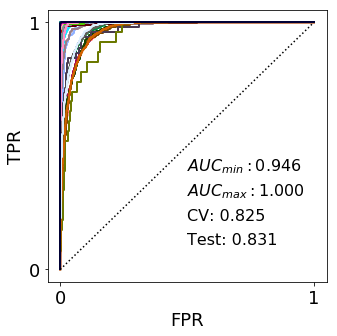

... storing 'L1_Round0_self-projection' as categorical


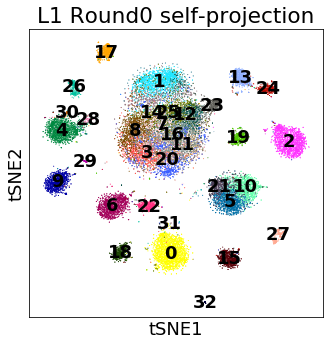

Accuracy on the training set: 0.8973
Accuracy on the hold-out set: 0.8184
Accuracy on the training set: 0.9037
Accuracy on the hold-out set: 0.8278
Max R1mat: 0.471910
Max R2mat: 0.008443


<Figure size 360x360 with 0 Axes>

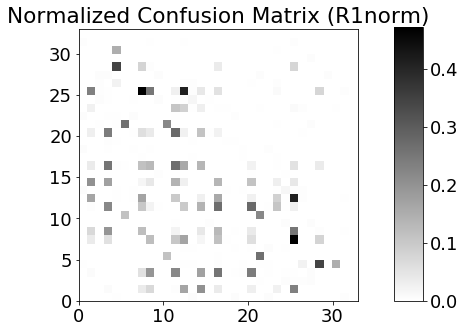

<Figure size 360x360 with 0 Axes>

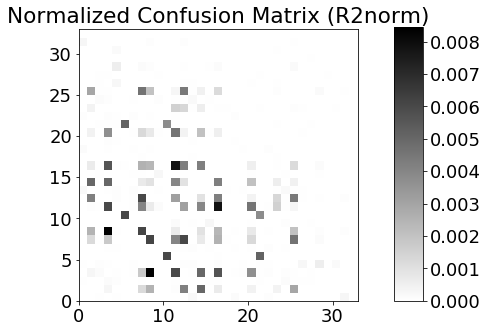

... storing 'L1_Round1' as categorical


IGRAPH U-W- 33 8 --
+ attr: weight (e)
+ edges:
3--8 7--25 3--8 11--16 12--25 11--16 7--25 12--25


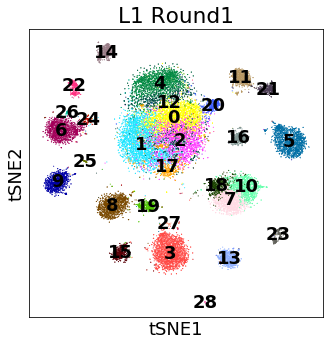

Round2 ...
Mean CV accuracy: 0.8789
Accuracy on the training set: 0.9350
Accuracy on the hold-out set: 0.8383


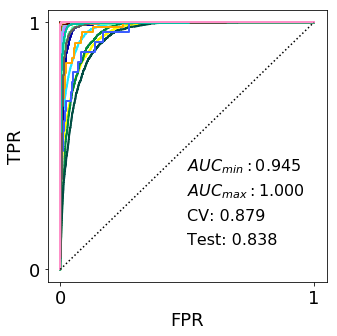

... storing 'L1_Round1_self-projection' as categorical


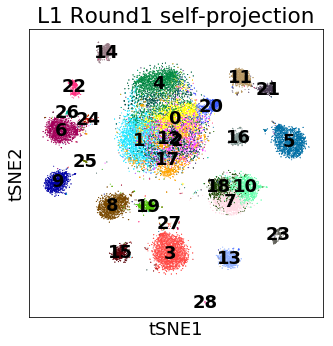

Accuracy on the training set: 0.9397
Accuracy on the hold-out set: 0.8453
Accuracy on the training set: 0.9342
Accuracy on the hold-out set: 0.8414
Max R1mat: 0.544153
Max R2mat: 0.017855


<Figure size 360x360 with 0 Axes>

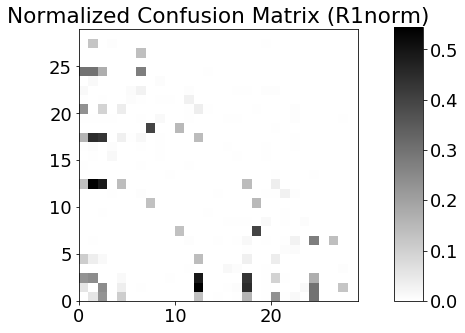

<Figure size 360x360 with 0 Axes>

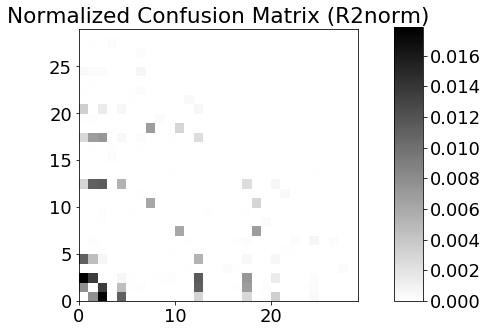

... storing 'L1_Round2' as categorical


IGRAPH U-W- 29 16 --
+ attr: weight (e)
+ edges:
0--1 0--2 0--4 0--1 1--2 1--12 1--17 0--2 1--2 2--12 2--17 0--4 1--12 2--12
1--17 2--17


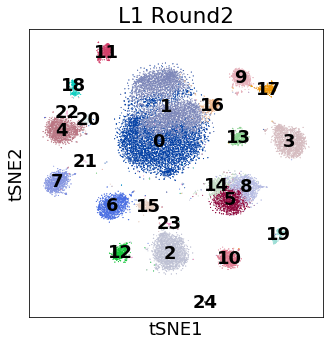

Round3 ...
Mean CV accuracy: 0.9345
Accuracy on the training set: 0.9691
Accuracy on the hold-out set: 0.9001


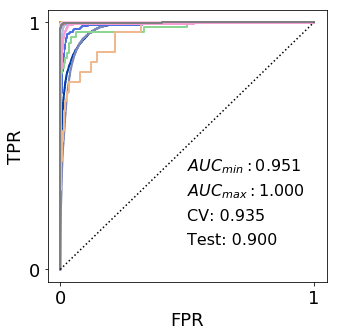

... storing 'L1_Round2_self-projection' as categorical


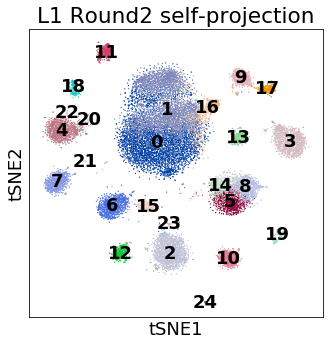

Accuracy on the training set: 0.9691
Accuracy on the hold-out set: 0.9049
Accuracy on the training set: 0.9700
Accuracy on the hold-out set: 0.9044
Max R1mat: 0.433333
Max R2mat: 0.052346


<Figure size 360x360 with 0 Axes>

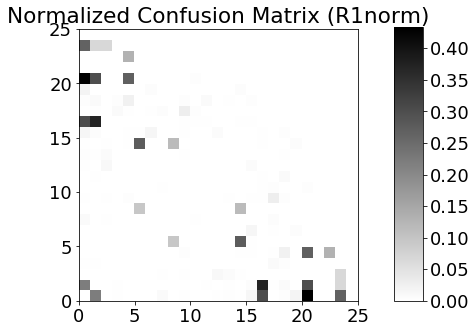

<Figure size 360x360 with 0 Axes>

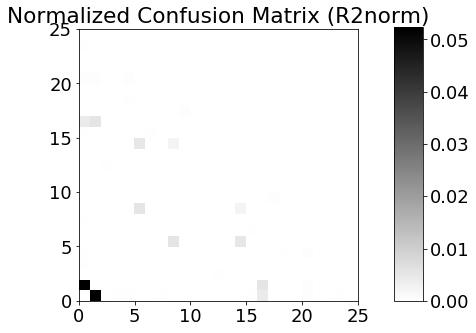

... storing 'L1_Round3' as categorical


IGRAPH U-W- 25 4 --
+ attr: weight (e)
+ edges:
0--1 0--20 0--1 0--20


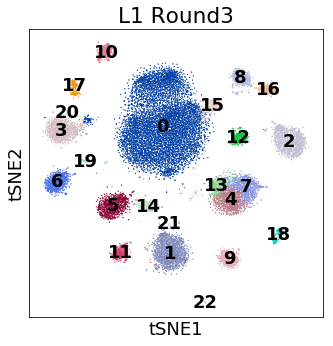

Round4 ...
Mean CV accuracy: 0.9481
Accuracy on the training set: 0.9847
Accuracy on the hold-out set: 0.9563


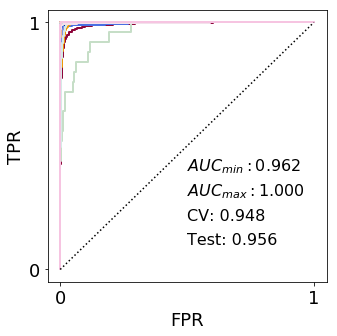

... storing 'L1_Round3_self-projection' as categorical


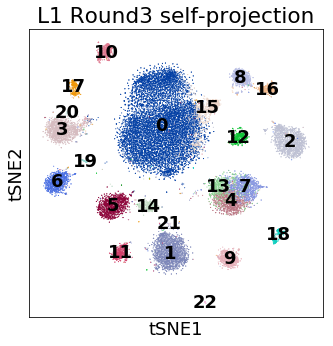

Accuracy on the training set: 0.9812
Accuracy on the hold-out set: 0.9582
Accuracy on the training set: 0.9886
Accuracy on the hold-out set: 0.9588
Max R1mat: 0.563694
Max R2mat: 0.007499


<Figure size 360x360 with 0 Axes>

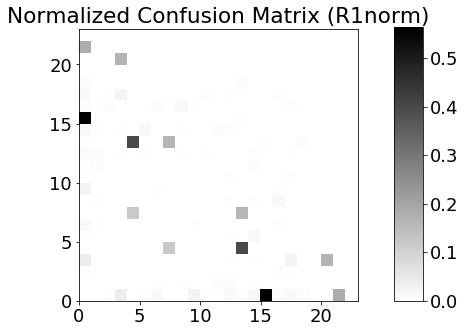

<Figure size 360x360 with 0 Axes>

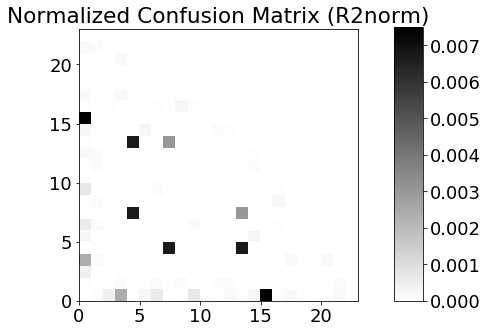

... storing 'L1_Round4' as categorical


IGRAPH U-W- 23 4 --
+ attr: weight (e)
+ edges:
0--15 4--13 4--13 0--15


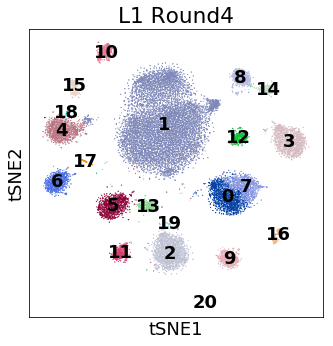

Round5 ...
Mean CV accuracy: 0.9566
Accuracy on the training set: 0.9868
Accuracy on the hold-out set: 0.9756


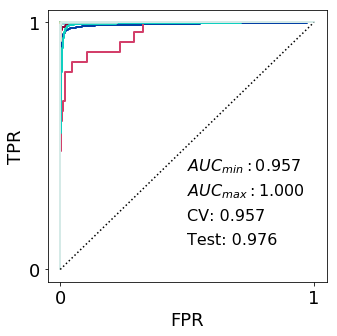

... storing 'L1_Round4_self-projection' as categorical


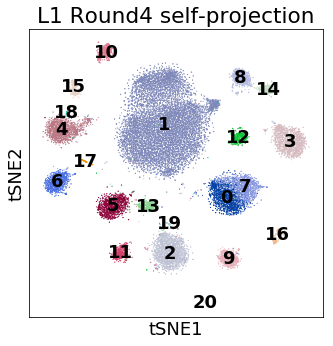

Accuracy on the training set: 0.9940
Accuracy on the hold-out set: 0.9766
Accuracy on the training set: 0.9857
Accuracy on the hold-out set: 0.9743
Max R1mat: 0.219680
Max R2mat: 0.011091


<Figure size 360x360 with 0 Axes>

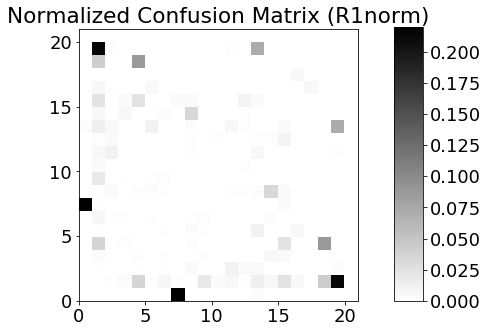

<Figure size 360x360 with 0 Axes>

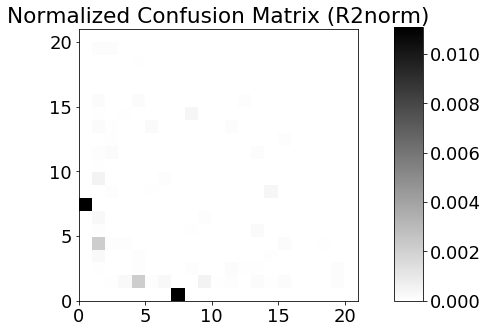

... storing 'L1_Round5' as categorical


IGRAPH U-W- 21 2 --
+ attr: weight (e)
+ edges:
0--7 0--7


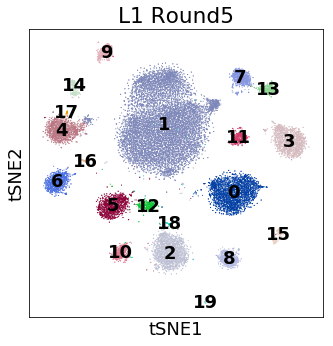

Round6 ...
Mean CV accuracy: 0.9762
Accuracy on the training set: 0.9924
Accuracy on the hold-out set: 0.9867


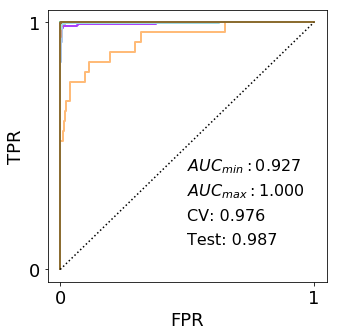

... storing 'L1_Round5_self-projection' as categorical


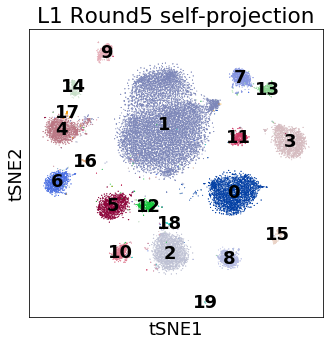

Accuracy on the training set: 0.9936
Accuracy on the hold-out set: 0.9881
Accuracy on the training set: 0.9948
Accuracy on the hold-out set: 0.9853
Max R1mat: 0.250000
Max R2mat: 0.002210


<Figure size 360x360 with 0 Axes>

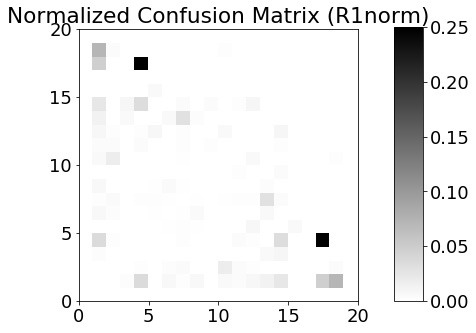

<Figure size 360x360 with 0 Axes>

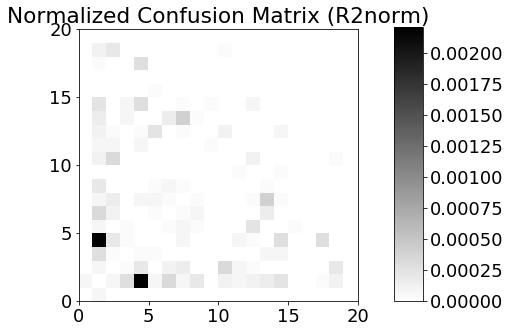

IGRAPH U-W- 20 0 --
+ attr: weight (e)
Converged!
m1: 0.250000
m2: 0.002210
Accuracy: 0.985264


In [44]:
SCCAF_optimize_all(min_acc=0.96, ad=ad, use='pca', basis='tsne')

In [45]:
ad.write("../write/Shekhar_reg2.h5")

start_iter: 0
R1norm_cutoff: 0.500000
R2norm_cutoff: 0.050000
Accuracy: 0.000000
Round1 ...
Mean CV accuracy: 0.8215
Accuracy on the training set: 0.8990
Accuracy on the hold-out set: 0.8236


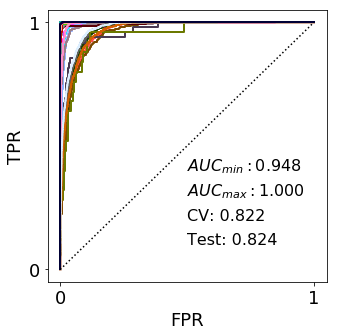

... storing 'L1_Round0_self-projection' as categorical


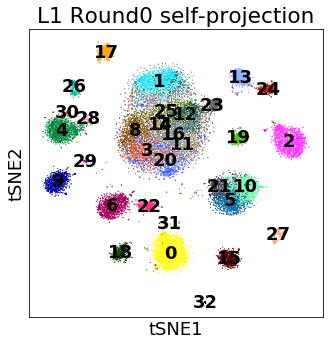

Accuracy on the training set: 0.8912
Accuracy on the hold-out set: 0.8299
Accuracy on the training set: 0.9003
Accuracy on the hold-out set: 0.8210
Max R1mat: 0.380488
Max R2mat: 0.008526


<Figure size 360x360 with 0 Axes>

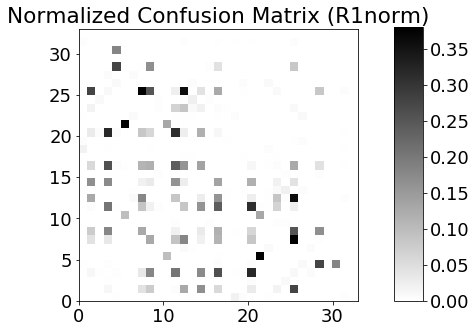

<Figure size 360x360 with 0 Axes>

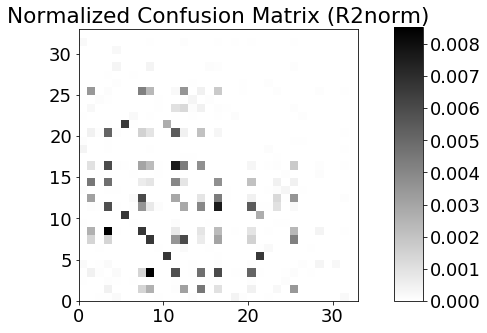

IGRAPH U-W- 33 0 --
+ attr: weight (e)
Converged!
m1: 0.380488
m2: 0.008526
Accuracy: 0.821005
start_iter: 0
R1norm_cutoff: 0.370488
R2norm_cutoff: 0.007526
Accuracy: 0.821005
Round1 ...
Mean CV accuracy: 0.8269
Accuracy on the training set: 0.8993
Accuracy on the hold-out set: 0.8262


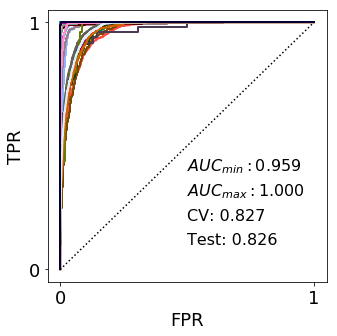

... storing 'L1_Round0_self-projection' as categorical


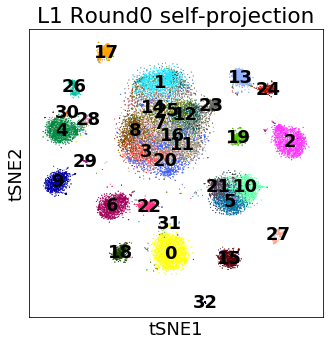

Accuracy on the training set: 0.9060
Accuracy on the hold-out set: 0.8233
Accuracy on the training set: 0.8905
Accuracy on the hold-out set: 0.8223
Max R1mat: 0.365079
Max R2mat: 0.009383


<Figure size 360x360 with 0 Axes>

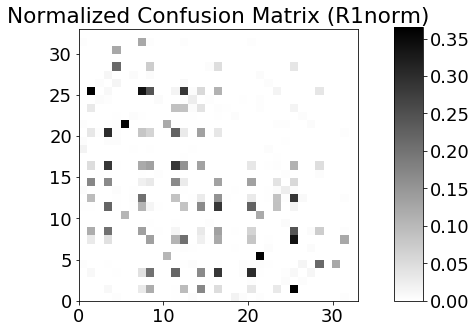

<Figure size 360x360 with 0 Axes>

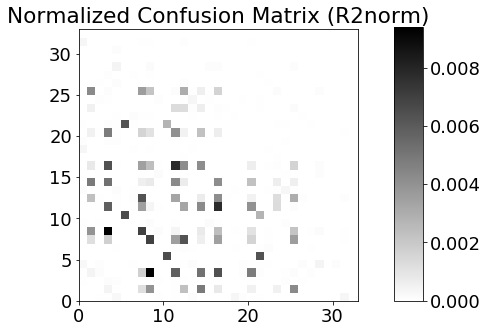

... storing 'L1_Round1' as categorical


IGRAPH U-W- 33 4 --
+ attr: weight (e)
+ edges:
3--8 3--8 11--16 11--16


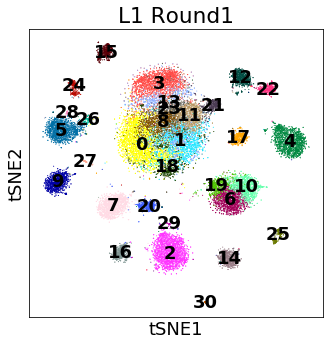

Round2 ...
Mean CV accuracy: 0.8433
Accuracy on the training set: 0.9083
Accuracy on the hold-out set: 0.8274


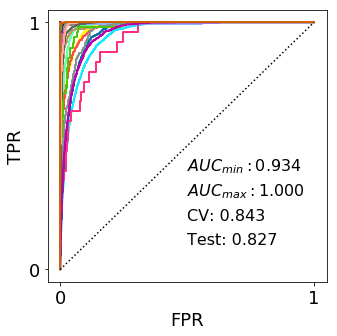

... storing 'L1_Round1_self-projection' as categorical


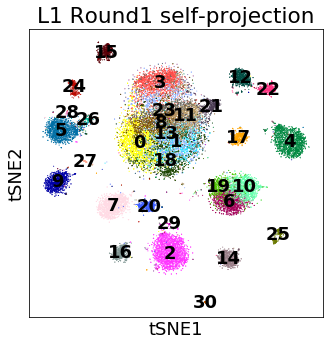

Accuracy on the training set: 0.9220
Accuracy on the hold-out set: 0.8286
Accuracy on the training set: 0.9220
Accuracy on the hold-out set: 0.8337
Max R1mat: 0.507246
Max R2mat: 0.012443


<Figure size 360x360 with 0 Axes>

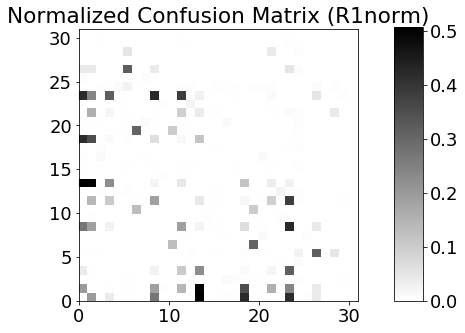

<Figure size 360x360 with 0 Axes>

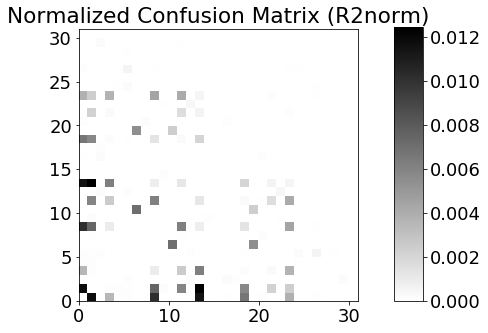

... storing 'L1_Round2' as categorical


IGRAPH U-W- 31 18 --
+ attr: weight (e)
+ edges:
0--1 0--8 0--13 0--18 0--23 0--1 1--8 1--13 0--8 1--8 8--23 11--23 0--13 1--13
0--18 0--23 8--23 11--23


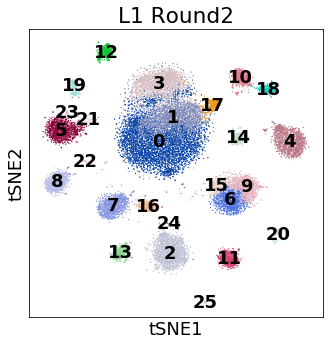

Round3 ...
Mean CV accuracy: 0.9202
Accuracy on the training set: 0.9617
Accuracy on the hold-out set: 0.8906


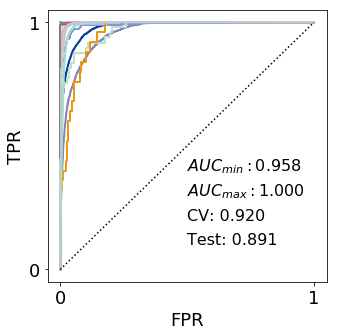

... storing 'L1_Round2_self-projection' as categorical


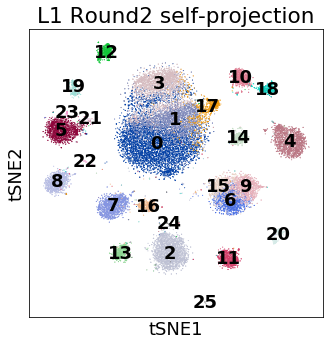

Accuracy on the training set: 0.9674
Accuracy on the hold-out set: 0.8814
Accuracy on the training set: 0.9599
Accuracy on the hold-out set: 0.8975
Max R1mat: 0.395706
Max R2mat: 0.032345


<Figure size 360x360 with 0 Axes>

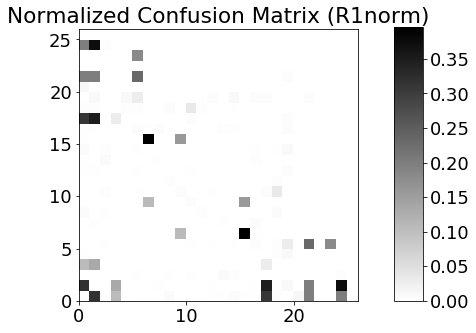

<Figure size 360x360 with 0 Axes>

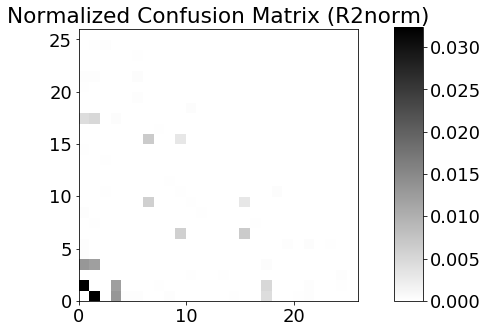

... storing 'L1_Round3' as categorical


IGRAPH U-W- 26 10 --
+ attr: weight (e)
+ edges:
0--1 0--3 0--1 1--3 1--24 0--3 1--3 6--15 6--15 1--24


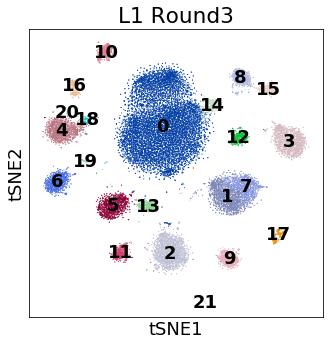

Round4 ...
Mean CV accuracy: 0.9681
Accuracy on the training set: 0.9892
Accuracy on the hold-out set: 0.9675


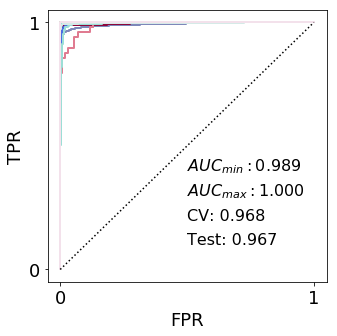

... storing 'L1_Round3_self-projection' as categorical


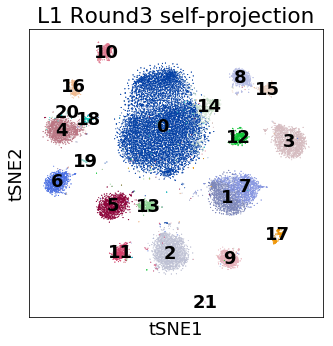

Accuracy on the training set: 0.9907
Accuracy on the hold-out set: 0.9665
Accuracy on the training set: 0.9949
Accuracy on the hold-out set: 0.9588
Max R1mat: 0.583333
Max R2mat: 0.010109


<Figure size 360x360 with 0 Axes>

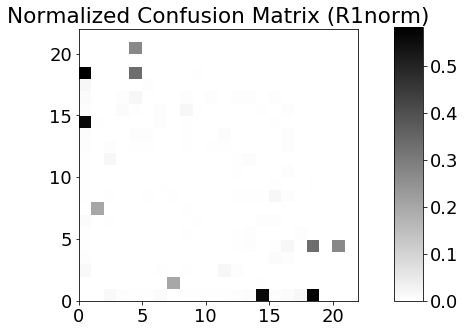

<Figure size 360x360 with 0 Axes>

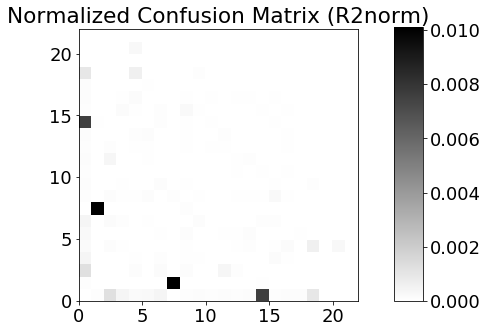

... storing 'L1_Round4' as categorical


IGRAPH U-W- 22 6 --
+ attr: weight (e)
+ edges:
0--14 0--18 1--7 1--7 0--14 0--18


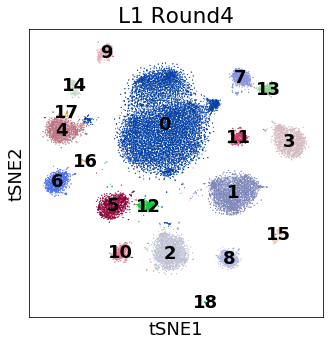

Round5 ...
Mean CV accuracy: 0.9835
Accuracy on the training set: 0.9988
Accuracy on the hold-out set: 0.9868


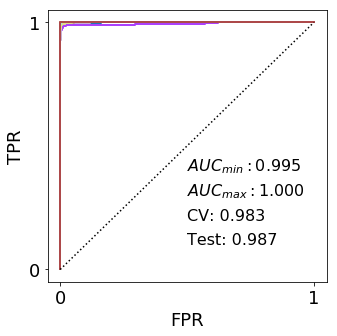

... storing 'L1_Round4_self-projection' as categorical


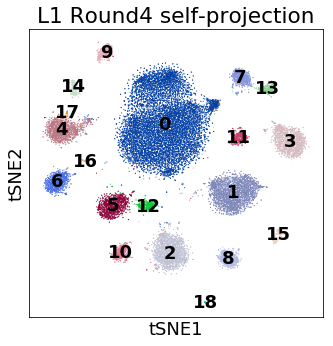

Accuracy on the training set: 0.9994
Accuracy on the hold-out set: 0.9872
Accuracy on the training set: 0.9988
Accuracy on the hold-out set: 0.9866
Max R1mat: 0.166667
Max R2mat: 0.001601


<Figure size 360x360 with 0 Axes>

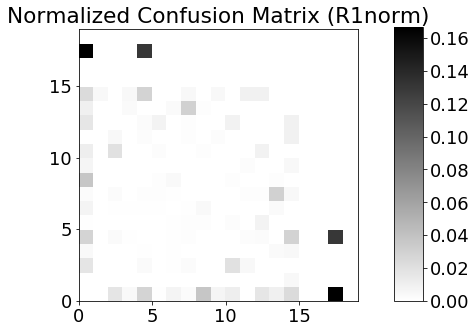

<Figure size 360x360 with 0 Axes>

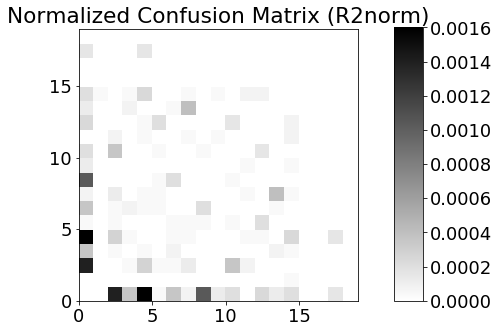

IGRAPH U-W- 19 0 --
+ attr: weight (e)
Converged!
m1: 0.166667
m2: 0.001601
Accuracy: 0.986632
start_iter: 4
R1norm_cutoff: 0.156667
R2norm_cutoff: 0.000601
Accuracy: 0.986632
Round5 ...
Mean CV accuracy: 0.9876
Accuracy on the training set: 0.9988
Accuracy on the hold-out set: 0.9868


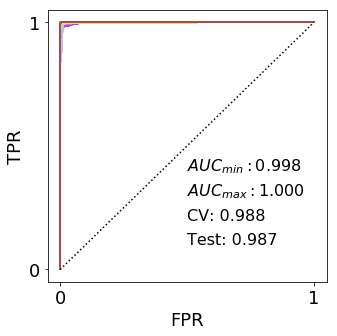

... storing 'L1_Round4_self-projection' as categorical


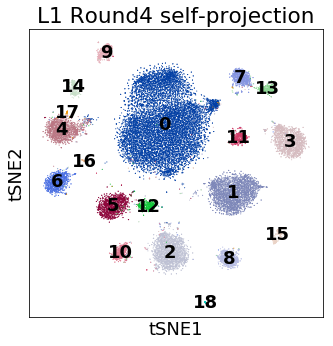

Accuracy on the training set: 0.9976
Accuracy on the hold-out set: 0.9860
Accuracy on the training set: 0.9971
Accuracy on the hold-out set: 0.9877
Max R1mat: 0.142857
Max R2mat: 0.001363


<Figure size 360x360 with 0 Axes>

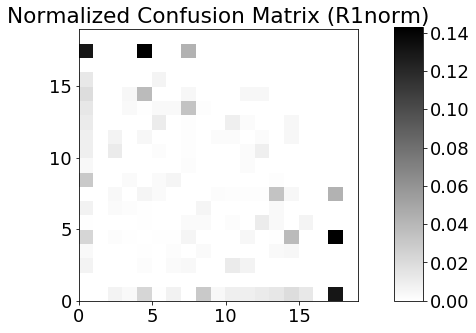

<Figure size 360x360 with 0 Axes>

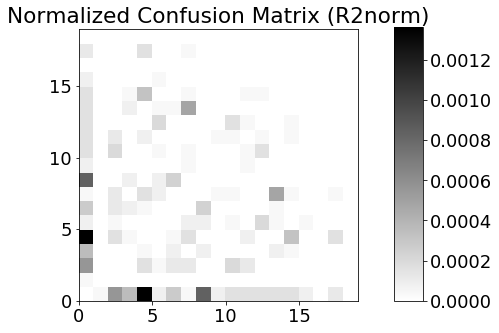

... storing 'L1_Round5' as categorical


IGRAPH U-W- 19 4 --
+ attr: weight (e)
+ edges:
0--4 0--8 0--4 0--8


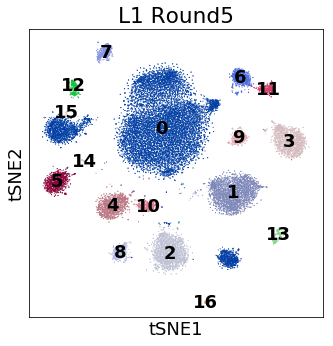

Round6 ...
Mean CV accuracy: 0.9793
Accuracy on the training set: 0.9947
Accuracy on the hold-out set: 0.9792


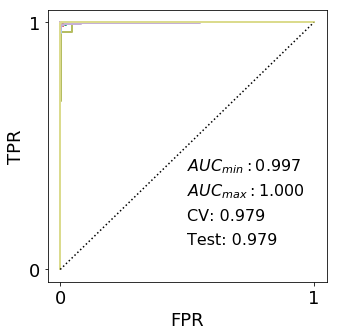

... storing 'L1_Round5_self-projection' as categorical


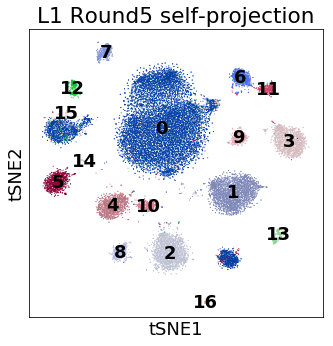

Accuracy on the training set: 0.9973
Accuracy on the hold-out set: 0.9813
Accuracy on the training set: 0.9987
Accuracy on the hold-out set: 0.9704
Max R1mat: 5.409091
Max R2mat: 0.004777


<Figure size 360x360 with 0 Axes>

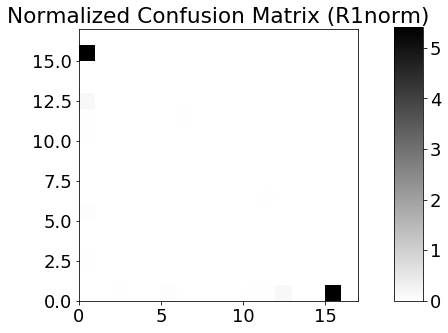

<Figure size 360x360 with 0 Axes>

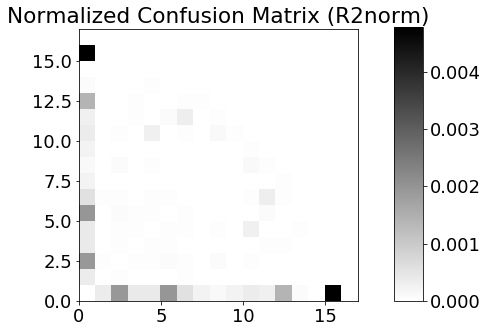

... storing 'L1_Round6' as categorical


IGRAPH U-W- 17 8 --
+ attr: weight (e)
+ edges:
0--2 0--5 0--12 0--15 0--2 0--5 0--12 0--15


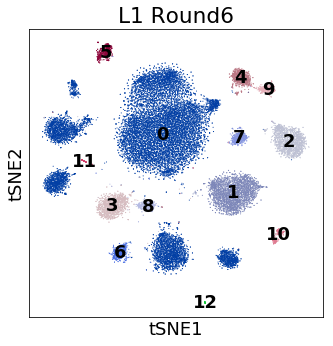

Round7 ...
Mean CV accuracy: 0.9829
Accuracy on the training set: 0.9974
Accuracy on the hold-out set: 0.9842


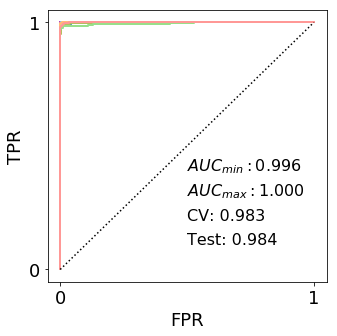

... storing 'L1_Round6_self-projection' as categorical


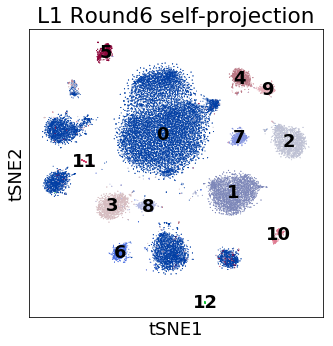

Accuracy on the training set: 0.9991
Accuracy on the hold-out set: 0.9823
Accuracy on the training set: 1.0000
Accuracy on the hold-out set: 0.9789
Max R1mat: 0.121212
Max R2mat: 0.001656


<Figure size 360x360 with 0 Axes>

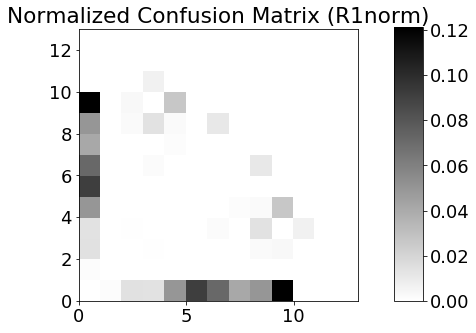

<Figure size 360x360 with 0 Axes>

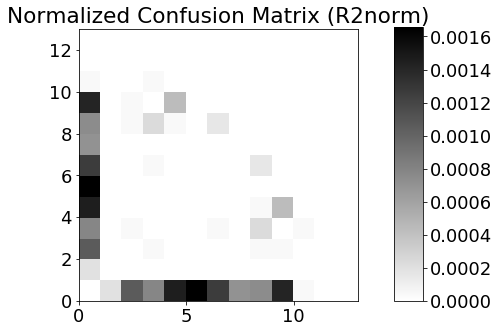

... storing 'L1_Round7' as categorical


IGRAPH U-W- 13 16 --
+ attr: weight (e)
+ edges:
0--2 0--3 0--4 0--5 0--6 0--7 0--8 0--9 0--2 0--3 0--4 0--5 0--6 0--7 0--8
0--9


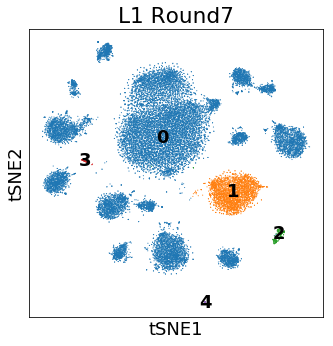

Round8 ...
Mean CV accuracy: 0.9946
Accuracy on the training set: 1.0000
Accuracy on the hold-out set: 0.9962


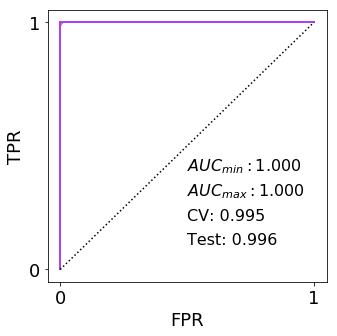

... storing 'L1_Round7_self-projection' as categorical


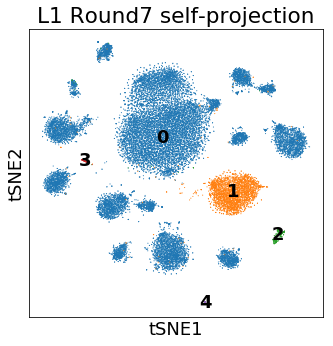

Accuracy on the training set: 1.0000
Accuracy on the hold-out set: 0.9969
Accuracy on the training set: 1.0000
Accuracy on the hold-out set: 0.9958
Max R1mat: 0.060000
Max R2mat: 0.002498


<Figure size 360x360 with 0 Axes>

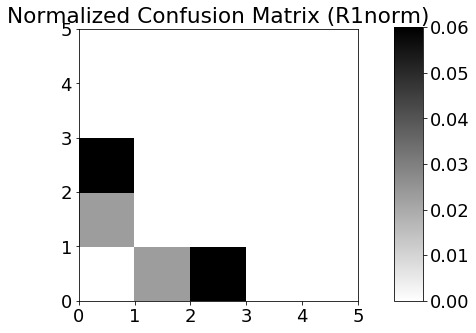

<Figure size 360x360 with 0 Axes>

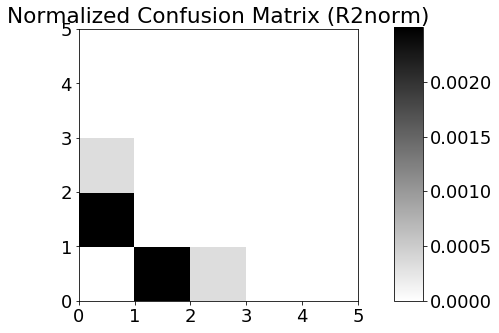

... storing 'L1_Round8' as categorical


IGRAPH U-W- 5 2 --
+ attr: weight (e)
+ edges:
0--1 0--1


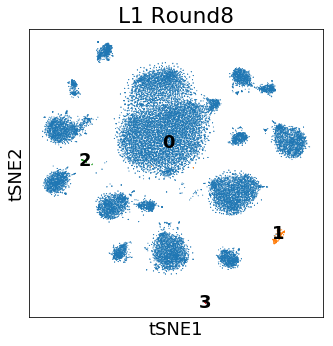

Round9 ...
Mean CV accuracy: 1.0000
Accuracy on the training set: 1.0000
Accuracy on the hold-out set: 0.9989


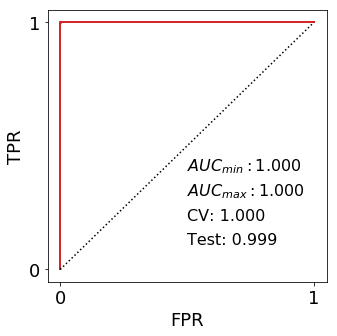

... storing 'L1_Round8_self-projection' as categorical


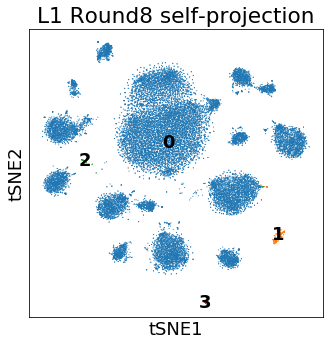

Accuracy on the training set: 1.0000
Accuracy on the hold-out set: 0.9991
Accuracy on the training set: 1.0000
Accuracy on the hold-out set: 0.9983
Max R1mat: 0.112583
Max R2mat: 0.000641


<Figure size 360x360 with 0 Axes>

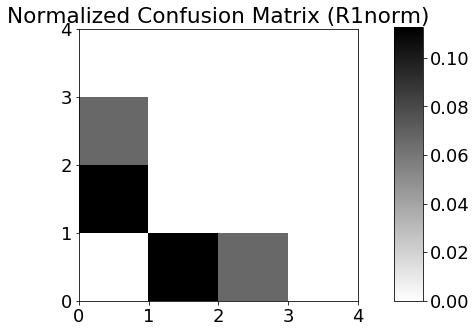

<Figure size 360x360 with 0 Axes>

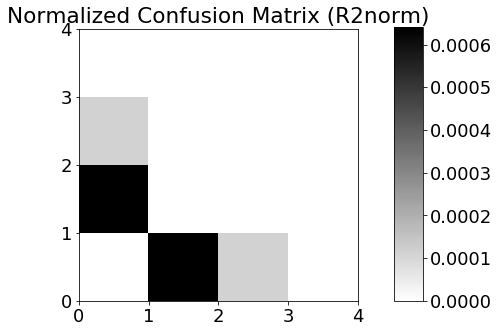

... storing 'L1_Round9' as categorical


IGRAPH U-W- 4 2 --
+ attr: weight (e)
+ edges:
0--1 0--1


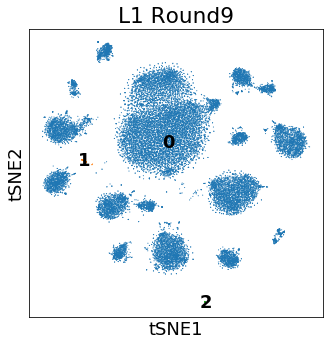

Round10 ...
Mean CV accuracy: 1.0000
Accuracy on the training set: 1.0000
Accuracy on the hold-out set: 0.9998


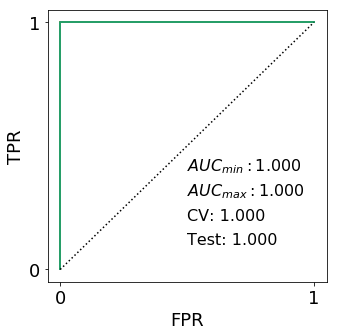

... storing 'L1_Round9_self-projection' as categorical


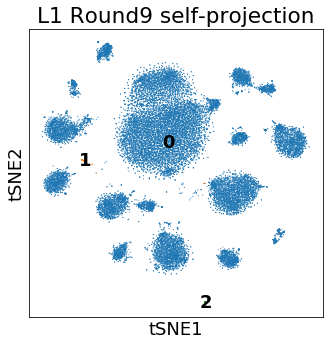

Accuracy on the training set: 1.0000
Accuracy on the hold-out set: 0.9998
Accuracy on the training set: 1.0000
Accuracy on the hold-out set: 0.9998
Max R1mat: 0.108696
Max R2mat: 0.000188


<Figure size 360x360 with 0 Axes>

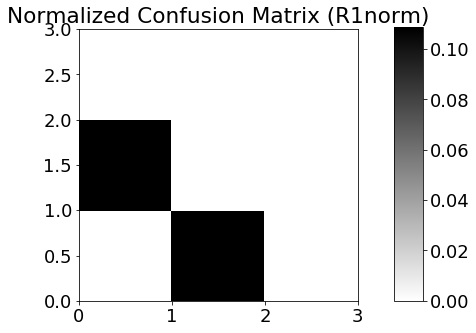

<Figure size 360x360 with 0 Axes>

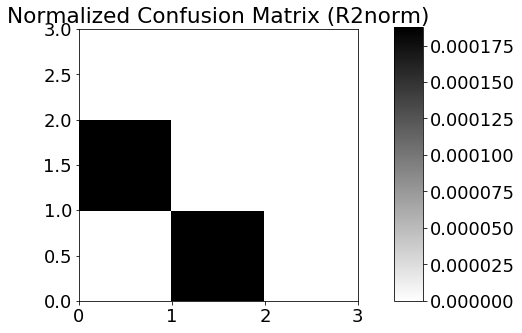

IGRAPH U-W- 3 0 --
+ attr: weight (e)
Converged!
m1: 0.108696
m2: 0.000188
Accuracy: 0.999775


In [47]:
SCCAF_optimize_all(min_acc=0.987, ad=ad, use='pca', basis='tsne')

In [48]:
ad.write('../write/Shekhar_reg3.h5')

In [21]:
ad = sc.read('../write/Shekhar_reg1.h5')

In [22]:
for i in [0,1,2]:
    ad.obs['R%d'%i] = ad.obs['L1_Round%d'%i]
    ad.obs['SP%d'%i] = ad.obs['L1_Round%d_self-projection'%i]
    ad.uns['R%d_colors'%i] = color_long+default_64
    ad.uns['SP%d_colors'%i] = color_long+default_64
    ad.obs['ACC%d'%i] = (ad.obs['R%d'%i] == ad.obs['SP%d'%i])
    ad.obs['ACC%d'%i] = ad.obs['ACC%d'%i].astype("category")
    ad.uns['ACC%d_colors'%i] = ['#800000','#d8d8d8',]
    ad.obs['ACC%d'%i].cat.categories = ['wrong','right']

In [23]:
matplotlib.rcParams.update({'font.size': 18})

In [24]:
sc.settings.set_figure_params(dpi=80)

saving figure to file ./figures/tsne_Shekhar_S3part1.pdf


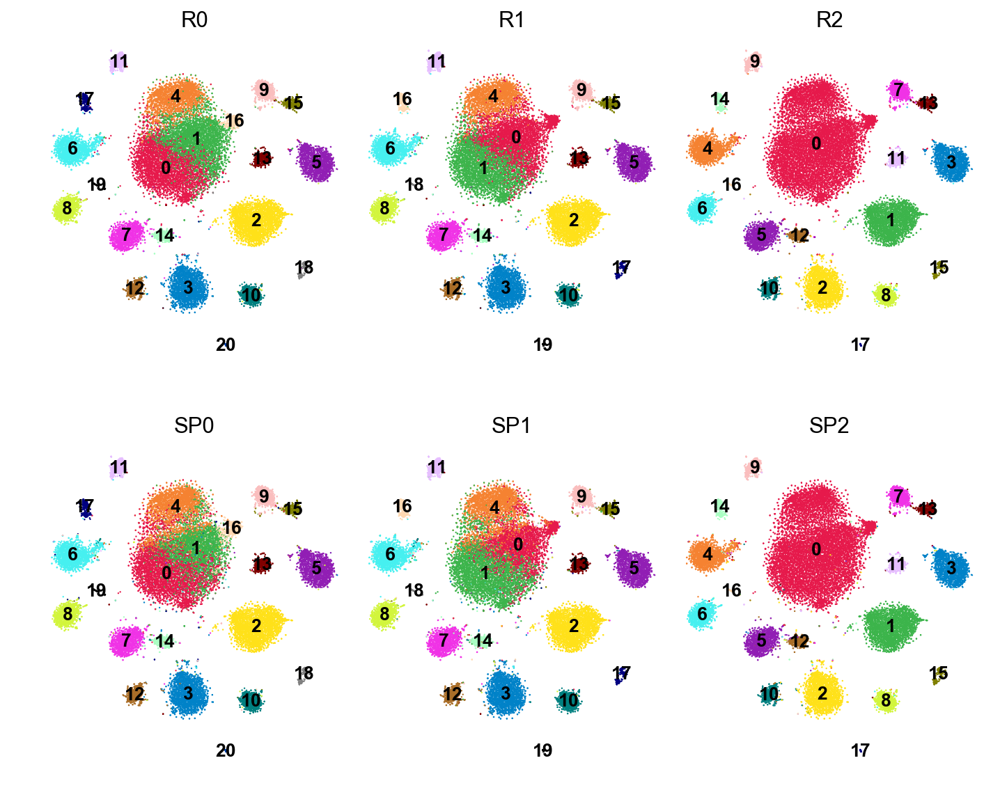

In [29]:
figsize(4,4)
sc.pl.tsne(ad, color=['R%d'%i for i in [0,1,2]]+['SP%d'%i for i in [0,1,2]], \
           legend_loc='on data',wspace=-0.08,frameon=False,ncols=3, legend_fontsize=12, save='_Shekhar_S3part1.pdf')

saving figure to file ./figures/tsne_Shekhar_S3part2.pdf


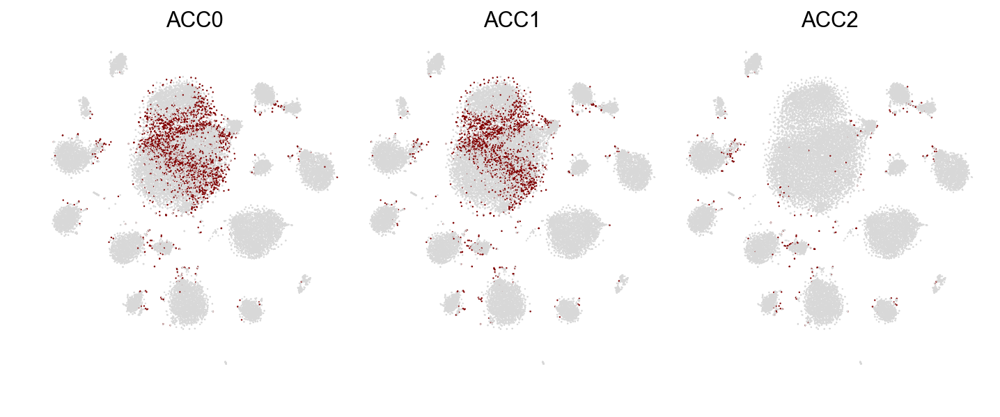

In [30]:
figsize(4,4)
sc.pl.tsne(ad, color=['ACC%d'%i for i in [0,1,2]], legend_loc='best',\
           wspace=-0.08,frameon=False, legend_fontsize=12, save='_Shekhar_S3part2.pdf')

saving figure to file ./figures/tsne_Shekhar_S3part3.pdf


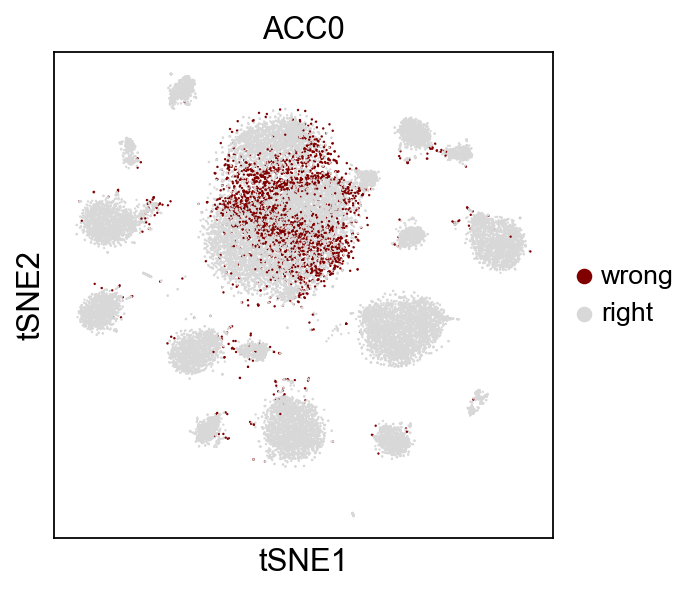

In [31]:
figsize(4,4)
sc.pl.tsne(ad, color=['ACC%d'%i for i in [0]],\
           wspace=-0.08, legend_fontsize=12,save='_Shekhar_S3part3.pdf')

In [56]:
ad.write("../write/Shekhar_reg1.h5")

## louvain clustering

In [30]:
ad = sc.read("../write/Shekhar_reg1.h5")

> FigS6A

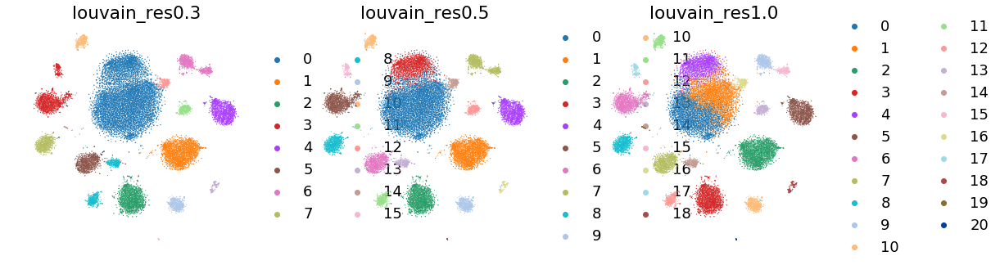

In [31]:
default_64[17] = '#FFA500'
figsize(5,5)
ad.uns['louvain_res0.3_colors']=default_20+default_26
ad.uns['louvain_res0.5_colors']=default_20+default_26
ad.uns['louvain_res1.0_colors']=default_20+default_26
matplotlib.rcParams.update({'font.size': 18})
sc.pl.tsne(ad, color=['louvain_res0.3','louvain_res0.5','louvain_res1.0'], frameon=False)

saving figure to file ./figures/tsne_Shekhar_res0.3.pdf


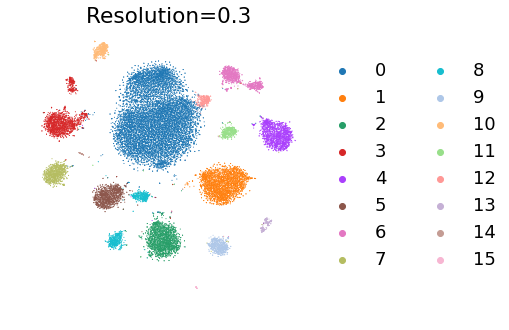

In [32]:
default_64[17] = '#FFA500'
figsize(5,5)
matplotlib.rcParams.update({'font.size': 18})
sc.pl.tsne(ad, color=['louvain_res0.3'],title='Resolution=0.3', frameon=False, save='_Shekhar_res0.3.pdf')

saving figure to file ./figures/tsne_Shekhar_res0.5.pdf


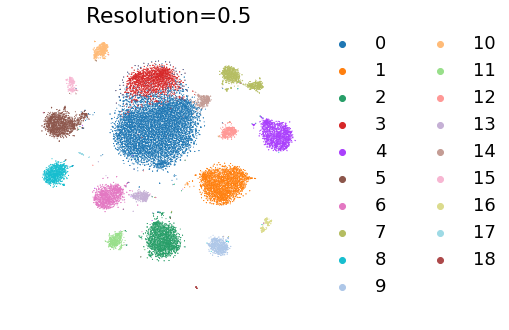

In [33]:
default_64[17] = '#FFA500'
figsize(5,5)
matplotlib.rcParams.update({'font.size': 18})
sc.pl.tsne(ad, color=['louvain_res0.5'],title='Resolution=0.5', frameon=False, save='_Shekhar_res0.5.pdf')

saving figure to file ./figures/tsne_Shekhar_res1.0.pdf


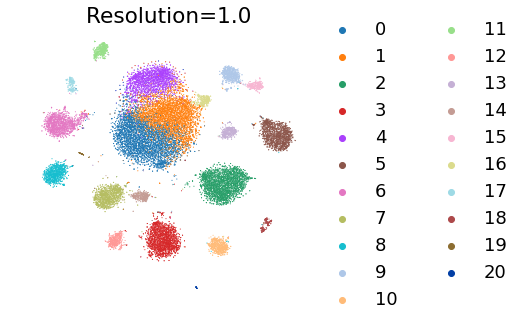

In [34]:
default_64[17] = '#FFA500'
figsize(5,5)
matplotlib.rcParams.update({'font.size': 18})
sc.pl.tsne(ad, color=['louvain_res1.0'],title='Resolution=1.0', frameon=False, save='_Shekhar_res1.0.pdf')

saving figure to file ./figures/tsne_Shekhar_colorbar20.pdf


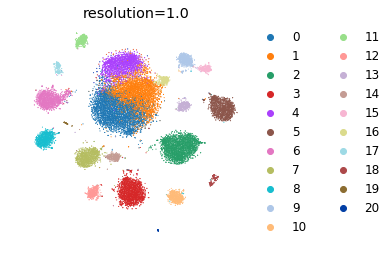

In [35]:
figsize(4,4)
matplotlib.rcParams.update({'font.size': 12})
sc.pl.tsne(ad, color=['louvain_res1.0'],title='resolution=1.0', frameon=False, save='_Shekhar_colorbar20.pdf')

In [36]:
%%time
mod='1';
c_iter=3; 
n_iter=10; 
start_iter = 0; 
sparsity=0.5; 
n=100; 
fraction=0.5; 
R1norm_cutoff = 0.1;
R2norm_cutoff = 1;
dist_cutoff = 8;


old_id = 'L1_Round0'
labels = np.sort(ad.obs[old_id].unique().astype(int)).astype(str)

# optimize
y_prob, y_pred, y_test, clf, cvsm, acc =  \
    self_projection(ad.X, ad.obs[old_id], sparsity=sparsity, n=n, \
    fraction=fraction, classifier = 'LR', cv=0)

Accuracy on the training set: 1.0000
Accuracy on the hold-out set: 0.7523
CPU times: user 46.6 s, sys: 12.8 s, total: 59.4 s
Wall time: 50.5 s


In [37]:
cmat = confusion_matrix(y_test, y_pred, clf, labels=labels)
xmat = normalize_confmat1(cmat, mod)

ymat = xmat2ymat(xmat, cmat, std=True)

In [38]:
old_id = 'louvain_res1.0'

saving figure to file ./figures/tsne_Shekhar_link.pdf


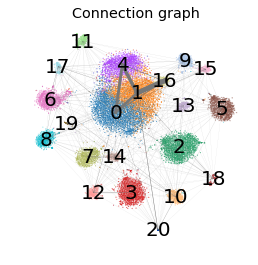

In [39]:
figsize(4,4)
fig,ax = plt.subplots()
ax = plot_link(ad, ymat=ymat, old_id = old_id, basis='tsne', line_weight = 5, ax=ax, line_color ='#777777')

sc.pl.tsne(ad, color=[old_id], color_map="RdYlBu_r",legend_loc='on data', \
           ax=ax, legend_fontsize=20, frameon=False, title = 'Connection graph',legend_fontweight='light', alpha=0.5, save='_Shekhar_link.pdf')

In [40]:
ad.obs['Mouse_Retina_Shekhar_et_al.'] = ad.obs['cell']
ad.uns['Mouse_Retina_Shekhar_et_al._colors'] = default_20+default_26

In [41]:
ad.obs['cell'].cat.categories

Index(['AC (Amacrine cell)', 'BC1A', 'BC1B', 'BC2', 'BC3A', 'BC3B', 'BC4',
       'BC5A (Cone Bipolar cell 5A)', 'BC5B', 'BC5C', 'BC5D', 'BC6',
       'BC7 (Cone Bipolar cell 7)', 'BC8/9 (mixture of BC8 and BC9)',
       'Cone Photoreceptors', 'MG (Mueller Glia)', 'RBC (Rod Bipolar cell)',
       'Rod Photoreceptors'],
      dtype='object')

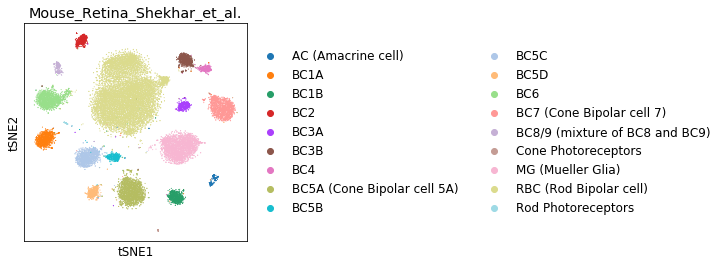

In [42]:
sc.pl.tsne(ad, color=['Mouse_Retina_Shekhar_et_al.'])

In [43]:
ad.obs['SCCAF_result'] = ad.obs['L1_result']

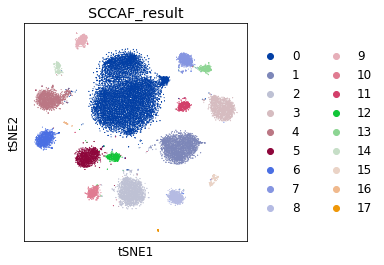

In [44]:
sc.pl.tsne(ad, color=['SCCAF_result'])

In [45]:
ad.obs['cell'] = ad.obs['cell'].cat.reorder_categories(['RBC (Rod Bipolar cell)',\
       'MG (Mueller Glia)','BC5A (Cone Bipolar cell 5A)','BC7 (Cone Bipolar cell 7)','BC6', 'BC5C','BC1A',\
       'BC3B','BC1B','BC2','BC5D','BC3A','BC5B','BC4','BC8/9 (mixture of BC8 and BC9)',\
       'AC (Amacrine cell)','Rod Photoreceptors','Cone Photoreceptors'])

saving figure to file ./figures/tsne_Shekhar_DE.pdf


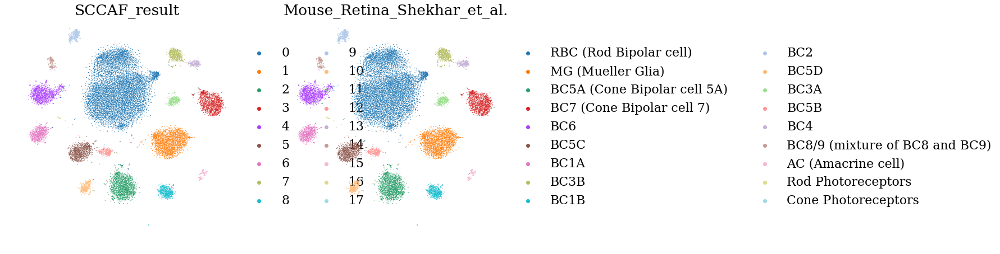

In [57]:
figsize(7,7)
matplotlib.rcParams.update({'font.size': 22})
sc.pl.tsne(ad, color=['L1_result','cell'],title=['SCCAF_result','Mouse_Retina_Shekhar_et_al.'], frameon=False, save='_Shekhar_DE.pdf')

In [47]:
ad.obs['louvain_res1.0'].cat.categories

Index(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12',
       '13', '14', '15', '16', '17', '18', '19', '20'],
      dtype='object')

In [48]:
ad.obs['louvain_res1.0'] = ad.obs['louvain_res1.0'].cat.reorder_categories(['0', \
        '2', '3','5','6', '7', '8', '9', '10', '11', '12',
       '13', '14', '15',  '17', '18', '19','20', '1', '4','16'])

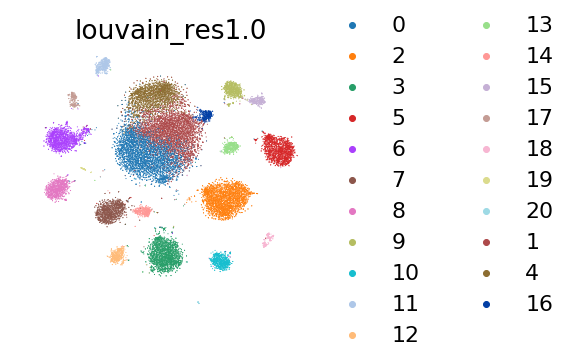

In [49]:
figsize(5,5)
sc.pl.tsne(ad, color=['louvain_res1.0'], frameon=False)

Mean CV accuracy: 0.8675
Accuracy on the training set: 1.0000
Accuracy on the hold-out set: 0.7464


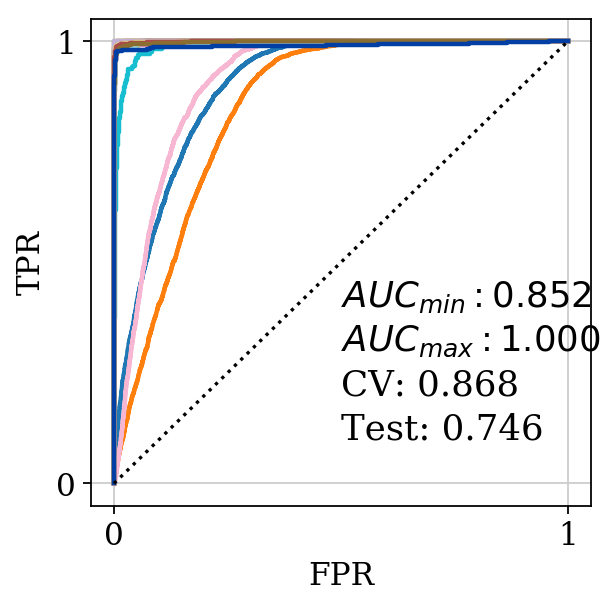

In [74]:
figsize(4,4)
y_prob, y_pred, y_test, clf, cvsm, acc = SCCAF_assessment(ad.X, ad.obs['louvain_res1.0'],n=100)
aucs = plot_roc(y_prob, y_test, clf, cvsm=cvsm, acc=acc,colors=ad.uns['louvain_res1.0_colors'])
plt.savefig("../Figs/Shekhar_louvain_ROC.pdf")

# FigS3

# River plot

In [58]:
leftLabels=ad.obs['SCCAF_result'].cat.categories
rightLabels=ad.obs['cell'].cat.categories

In [62]:
df1 = pd.Series(ad.uns['cell_colors'][:len(ad.obs['cell'].unique())],\
                index=ad.obs['cell'].cat.categories)

df2 = pd.Series(ad.uns['L1_result_colors'][:len(ad.obs['L1_result'].unique())],\
                index=ad.obs['L1_result'].cat.categories)

colorDict1 = dict(zip(df1.index,df1.tolist()))

colorDict = dict(zip(df2.index,df2.tolist()))

colorDict.update(colorDict1)

In [64]:
def sankey(left, right, leftWeight=None, rightWeight=None, colorDict=None,
           leftLabels=None, rightLabels=None, aspect=4, rightColor=False,
           fontsize=14, figure_name=None,closePlot=False):
    '''
    Make Sankey Diagram showing flow from left-->right

    Inputs:
        left = NumPy array of object labels on the left of the diagram
        right = NumPy array of corresponding labels on the right of the diagram
            len(right) == len(left)
        leftWeight = NumPy array of weights for each strip starting from the
            left of the diagram, if not specified 1 is assigned
        rightWeight = NumPy array of weights for each strip starting from the
            right of the diagram, if not specified the corresponding leftWeight
            is assigned
        colorDict = Dictionary of colors to use for each label
            {'label':'color'}
        leftLabels = order of the left labels in the diagram
        rightLabels = order of the right labels in the diagram
        aspect = vertical extent of the diagram in units of horizontal extent
        rightColor = If true, each strip in the diagram will be be colored
                    according to its left label
    Ouput:
        None
    '''
    if leftWeight is None:
        leftWeight = []
    if rightWeight is None:
        rightWeight = []
    if leftLabels is None:
        leftLabels = []
    if rightLabels is None:
        rightLabels = []
    # Check weights
    if len(leftWeight) == 0:
        leftWeight = np.ones(len(left))

    if len(rightWeight) == 0:
        rightWeight = leftWeight

    plt.figure()
    plt.rc('text', usetex=False)
    #'plt.rc('font', family='serif')

    # Create Dataframe
    if isinstance(left, pd.Series):
        left = left.reset_index(drop=True)
    if isinstance(right, pd.Series):
        right = right.reset_index(drop=True)
    df = pd.DataFrame({'left': left, 'right': right, 'leftWeight': leftWeight,
                       'rightWeight': rightWeight}, index=range(len(left)))

    if len(df[(df.left.isnull()) | (df.right.isnull())]):
        raise NullsInFrame('Sankey graph does not support null values.')

    # Identify all labels that appear 'left' or 'right'
    allLabels = pd.Series(np.r_[df.left.unique(), df.right.unique()]).unique()

    # Identify left labels
    if len(leftLabels) == 0:
        leftLabels = pd.Series(df.left.unique()).unique()
    else:
        check_data_matches_labels(leftLabels, df['left'], 'left')

    # Identify right labels
    if len(rightLabels) == 0:
        rightLabels = pd.Series(df.right.unique()).unique()
    else:
        check_data_matches_labels(rightLabels, df['right'], 'right')
    # If no colorDict given, make one
    if colorDict is None:
        colorDict = {}
        pal = "hls"
        cls = sns.color_palette(pal, len(allLabels))
        for i, l in enumerate(allLabels):
            colorDict[l] = cls[i]
    else:
        missing = [label for label in allLabels if label not in colorDict.keys()]
        if missing:
            raise RuntimeError('colorDict specified but missing values: '
                                '{}'.format(','.join(missing)))

    # Determine widths of individual strips
    ns_l = defaultdict()
    ns_r = defaultdict()
    for l in leftLabels:
        myD_l = {}
        myD_r = {}
        for l2 in rightLabels:
            myD_l[l2] = df[(df.left == l) & (df.right == l2)].leftWeight.sum()
            myD_r[l2] = df[(df.left == l) & (df.right == l2)].rightWeight.sum()
        ns_l[l] = myD_l
        ns_r[l] = myD_r

    # Determine positions of left label patches and total widths
    widths_left = defaultdict()
    for i, l in enumerate(leftLabels):
        myD = {}
        myD['left'] = df[df.left == l].leftWeight.sum()
        if i == 0:
            myD['bottom'] = 0
            myD['top'] = myD['left']
        else:
            myD['bottom'] = widths_left[leftLabels[i - 1]]['top'] + 0.02 * df.leftWeight.sum()
            myD['top'] = myD['bottom'] + myD['left']
            topEdge = myD['top']
        widths_left[l] = myD

    # Determine positions of right label patches and total widths
    widths_right = defaultdict()
    for i, l in enumerate(rightLabels):
        myD = {}
        myD['right'] = df[df.right == l].rightWeight.sum()
        if i == 0:
            myD['bottom'] = 0
            myD['top'] = myD['right']
        else:
            myD['bottom'] = widths_right[rightLabels[i - 1]]['top'] + 0.02 * df.rightWeight.sum()
            myD['top'] = myD['bottom'] + myD['right']
            topEdge = myD['top']
        widths_right[l] = myD

    # Total vertical extent of diagram
    xMax = topEdge / aspect

    # Draw vertical bars on left and right of each  label's section & print label
    for l in leftLabels:
        plt.fill_between(
            [-0.02 * xMax, 0],
            2 * [widths_left[l]['bottom']],
            2 * [widths_left[l]['bottom'] + widths_left[l]['left']],
            color=colorDict[l],
            alpha=0.99
        )
        plt.text(
            -0.05 * xMax,
            widths_left[l]['bottom'] + 0.5 * widths_left[l]['left'],
            l,
            {'ha': 'right', 'va': 'center'},
            fontsize=fontsize
        )
    for l in rightLabels:
        plt.fill_between(
            [xMax, 1.02 * xMax], 2 * [widths_right[l]['bottom']],
            2 * [widths_right[l]['bottom'] + widths_right[l]['right']],
            color=colorDict[l],
            alpha=0.99
        )
        plt.text(
            1.05 * xMax, widths_right[l]['bottom'] + 0.5 * widths_right[l]['right'],
            l,
            {'ha': 'left', 'va': 'center'},
            fontsize=fontsize
        )

    # Plot strips
    for l in leftLabels:
        for l2 in rightLabels:
            lc = l
            if rightColor:
                lc = l2
            if len(df[(df.left == l) & (df.right == l2)]) > 0:
                # Create array of y values for each strip, half at left value, half at right, convolve
                ys_d = np.array(50 * [widths_left[l]['bottom']] + 50 * [widths_right[l2]['bottom']])
                ys_d = np.convolve(ys_d, 0.05 * np.ones(20), mode='valid')
                ys_d = np.convolve(ys_d, 0.05 * np.ones(20), mode='valid')
                ys_u = np.array(50 * [widths_left[l]['bottom'] + ns_l[l][l2]] + 50 * [widths_right[l2]['bottom'] + ns_r[l][l2]])
                ys_u = np.convolve(ys_u, 0.05 * np.ones(20), mode='valid')
                ys_u = np.convolve(ys_u, 0.05 * np.ones(20), mode='valid')

                # Update bottom edges at each label so next strip starts at the right place
                widths_left[l]['bottom'] += ns_l[l][l2]
                widths_right[l2]['bottom'] += ns_r[l][l2]
                plt.fill_between(
                    np.linspace(0, xMax, len(ys_d)), ys_d, ys_u, alpha=0.65,
                    color=colorDict[lc]
                )
    plt.gca().axis('off')
#     plt.gcf().set_size_inches(6, 6)
    if figure_name!=None:
        plt.savefig("{}.pdf".format(figure_name), bbox_inches='tight', dpi=150)
    if closePlot:
        plt.close()

<Figure size 360x1008 with 0 Axes>

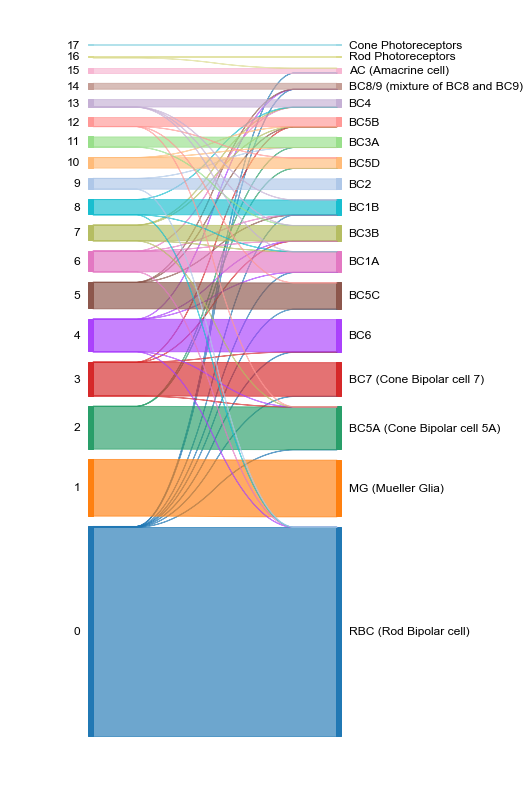

In [65]:
figsize(5,14)
plt.clf()
import matplotlib.pyplot as plt
plt.rcParams["font.family"] = "arial"
sankey(left=ad.obs['SCCAF_result'].tolist(), 
       right=ad.obs['Mouse_Retina_Shekhar_et_al.'].tolist(), 
       leftLabels=leftLabels.tolist(), rightLabels=rightLabels.tolist(),
       colorDict=colorDict,
       aspect=4, 
       fontsize=12)
plt.savefig("../Figs/Shekhar_river.pdf")

# Figures

In [2]:
ad = sc.read("../write/Shekhar_reg1.h5")

saving figure to file ./figures/tsne_FigS5.pdf


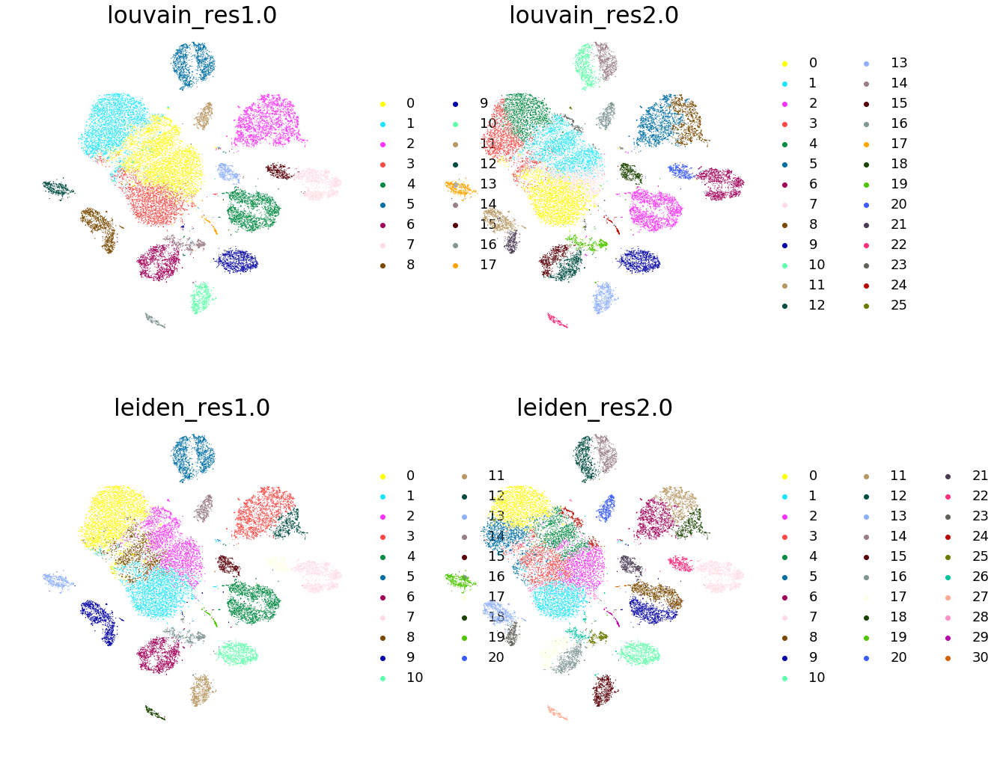

In [9]:
figsize(8,8)
ad.uns['leiden_res1.0_colors'] = default_64
matplotlib.rcParams.update({'font.size': 26})
sc.pl.tsne(ad, color=['louvain_res1.0','louvain_res2.0','leiden_res1.0','leiden_res2.0'], frameon=False, legend_fontsize=18, ncols=2,save='_FigS5.pdf')

In [75]:
figsize(4,4)
for i in range(3):
    y_prob, y_pred, y_test, clf, cvsm, acc = SCCAF_assessment(ad.X, ad.obs['L1_Round%d'%i],n=100)
    aucs = plot_roc(y_prob, y_test, clf, cvsm=cvsm, acc=acc, fontsize=14,colors=color_long+default_64)
    plt.savefig("../Figs/Shekhar_ROC_improve%d.pdf"%(i+1))
    plt.clf()

Mean CV accuracy: 0.8721
Accuracy on the training set: 1.0000
Accuracy on the hold-out set: 0.7420
Mean CV accuracy: 0.8845
Accuracy on the training set: 1.0000
Accuracy on the hold-out set: 0.7678
Mean CV accuracy: 0.9611
Accuracy on the training set: 1.0000
Accuracy on the hold-out set: 0.9789


<Figure size 320x320 with 0 Axes>

In [13]:
ss = '''Mean CV accuracy: 0.8721
Accuracy on the training set: 1.0000
Accuracy on the hold-out set: 0.7420
Mean CV accuracy: 0.8845
Accuracy on the training set: 1.0000
Accuracy on the hold-out set: 0.7678
Mean CV accuracy: 0.9611
Accuracy on the training set: 1.0000
Accuracy on the hold-out set: 0.9789'''

In [14]:
from io import StringIO
df = pd.read_csv(StringIO(ss), sep=":", header=None,index_col=0).T

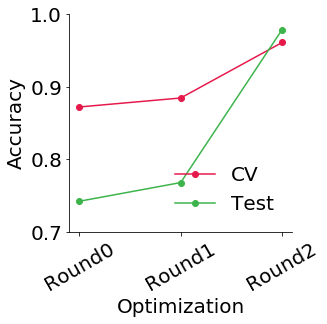

In [25]:
figsize(4,4)
matplotlib.rcParams.update({'font.size': 20})
ax = plt.subplot(111)
ax.plot(range(3),df['Mean CV accuracy'].loc[1],color=color_long[0],linestyle='-',marker='o',label='CV')
ax.plot(range(3),df['Accuracy on the hold-out set'].loc[1],color=color_long[1],linestyle='-',marker='o',label='Test')
plt.legend(loc='lower right',frameon=False)
plt.yticks([0.7,0.8,0.9,1])
plt.xticks([0,1,2],['Round0', 'Round1', 'Round2'],rotation=30)
plt.grid('off')
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
plt.xlabel("Optimization")
plt.ylabel("Accuracy")
plt.savefig("../Figs/Shekhar_ACC_increase.pdf")

In [2]:
ad = sc.read("../write/Shekhar_reg3.h5")
ad.uns['L1_Round3_colors'] = default_20+default_26
ad.uns['L1_Round4_colors'] = default_20+default_26
ad.uns['L1_Round5_colors'] = default_20+default_26

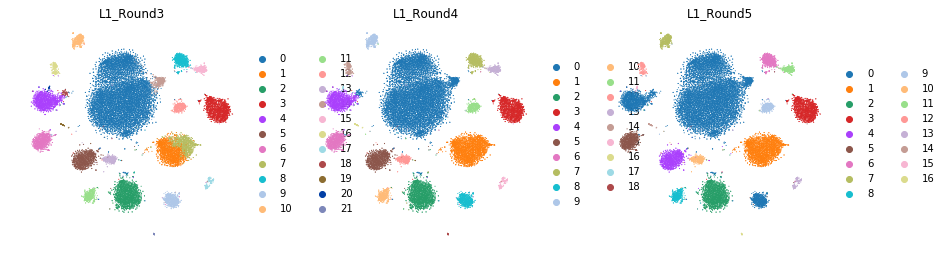

In [4]:
figsize(4,4)
sc.pl.tsne(ad, color=['L1_Round3', 'L1_Round4','L1_Round5'],frameon=False)

saving figure to file ./figures/tsne_Shekhar_R3.pdf


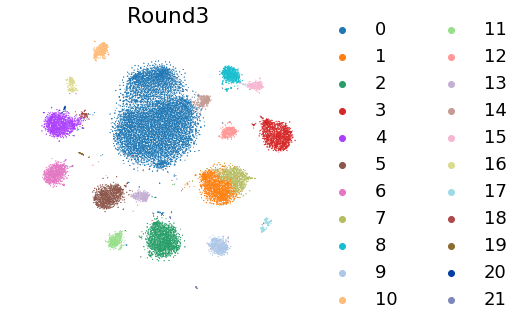

In [9]:
figsize(5,5)
matplotlib.rcParams.update({'font.size': 18})
sc.pl.tsne(ad, color=['L1_Round3'],frameon=False, title='Round3',save='_Shekhar_R3.pdf')

saving figure to file ./figures/tsne_Shekhar_R4.pdf


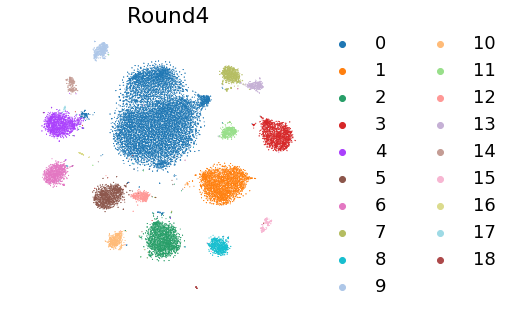

In [10]:
figsize(5,5)
matplotlib.rcParams.update({'font.size': 18})
sc.pl.tsne(ad, color=['L1_Round4'],frameon=False, title='Round4',save='_Shekhar_R4.pdf')

saving figure to file ./figures/tsne_Shekhar_R5.pdf


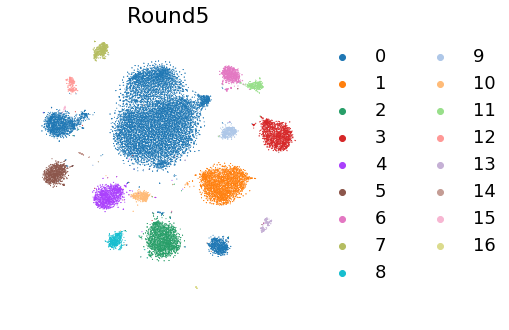

In [11]:
figsize(5,5)
matplotlib.rcParams.update({'font.size': 18})
sc.pl.tsne(ad, color=['L1_Round5'],frameon=False, title='Round5',save='_Shekhar_R5.pdf')

saving figure to file ./figures/tsne_Shekhar_colorbar.pdf


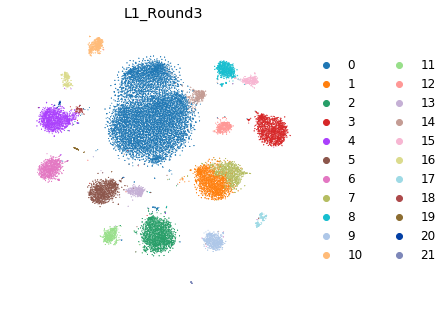

In [8]:
figsize(5,5)
matplotlib.rcParams.update({'font.size': 12})
sc.pl.tsne(ad, color=['L1_Round3'],frameon=False, save='_Shekhar_colorbar.pdf')

# SC3

> the data include 19 cell types, so we assign 18,19,20 as the cluster numbers for SC3.
This is the same for k-means clustering.

In [2]:
ad = sc.read("../write/Shekhar_reg.h5")

In [3]:
ad.shape

(27499, 13166)

In [19]:
df = pd.read_csv("../SCCAF_example/SC3.csv", sep=' ')

In [20]:
df.head()

,CLUSTER,SUB.CLUSTER,sc3_18_clusters,sc3_19_clusters,sc3_20_clusters,sc3_18_log2_outlier_score,sc3_19_log2_outlier_score,sc3_20_log2_outlier_score
Bipolar1_CCCACAAGACTA,BC5D,BC5D,5.0,2.0,2.0,5.6118,5.577502,5.910065
Bipolar1_TCGCCTCGTAAG,Doublets/Contaminants,Doublets/Contaminants,5.0,2.0,2.0,0.0000,0.000000,0.000000
Bipolar1_CAAAGCATTTGC,BC6,BC6,NaN,NaN,NaN,NaN,NaN,NaN
Bipolar1_CTTTTGATTGAC,BC7 (Cone Bipolar cell 7),BC7 (Cone Bipolar cell 7),NaN,NaN,NaN,NaN,NaN,NaN
Bipolar1_GCTCCAATGACA,RBC (Rod Bipolar cell),RBC (Rod Bipolar cell),NaN,NaN,NaN,NaN,NaN,NaN


In [21]:
df.tail()

,CLUSTER,SUB.CLUSTER,sc3_18_clusters,sc3_19_clusters,sc3_20_clusters,sc3_18_log2_outlier_score,sc3_19_log2_outlier_score,sc3_20_log2_outlier_score
Bipolar6_GGATCTTTCCAG,BC5C,BC5C,NaN,NaN,NaN,NaN,NaN,NaN
Bipolar6_GACCCTATTCGT,BC5B,BC5B,NaN,NaN,NaN,NaN,NaN,NaN
Bipolar6_GGTCTCTGAGCC,BC7 (Cone Bipolar cell 7),BC7 (Cone Bipolar cell 7),NaN,NaN,NaN,NaN,NaN,NaN
Bipolar6_GATGTGCTTATT,BC2,BC2,14.0,19.0,20.0,0.0,0.0,0.0
Bipolar6_GTAATCGGAACC,BC5A (Cone Bipolar cell 5A),BC5A (Cone Bipolar cell 5A),NaN,NaN,NaN,NaN,NaN,NaN


In [22]:
ad.obs_names

Index(['Bipolar1_CCCACAAGACTA', 'Bipolar1_TCGCCTCGTAAG',
       'Bipolar1_CAAAGCATTTGC', 'Bipolar1_CTTTTGATTGAC',
       'Bipolar1_GCTCCAATGACA', 'Bipolar1_AAATACCCTCAT',
       'Bipolar1_TGCATGCGTCCA', 'Bipolar1_TTCCGGCTTTTC',
       'Bipolar1_CAACGTATCCTT', 'Bipolar1_CATCGAACGACG',
       ...
       'Bipolar6_GGACCCGTTAAA', 'Bipolar6_GACCCGCTCATA',
       'Bipolar6_GACCGCATCCTG', 'Bipolar6_GAGGATTGTCTT',
       'Bipolar6_GACGTGTTCGGA', 'Bipolar6_GGATCTTTCCAG',
       'Bipolar6_GACCCTATTCGT', 'Bipolar6_GGTCTCTGAGCC',
       'Bipolar6_GATGTGCTTATT', 'Bipolar6_GTAATCGGAACC'],
      dtype='object', name='index', length=27499)

In [24]:
df = df.fillna(-1)

In [25]:
ad.obs['sc3_18'] = df['sc3_18_clusters'].astype(int)
ad.obs['sc3_19'] = df['sc3_19_clusters'].astype(int)
ad.obs['sc3_20'] = df['sc3_20_clusters'].astype(int)

In [27]:
for i in [18,19,20]:
    ad.obs['sc3_%d'%i] = ad.obs['sc3_%d'%i].astype(str)

... storing 'sc3_18' as categorical
... storing 'sc3_19' as categorical
... storing 'sc3_20' as categorical


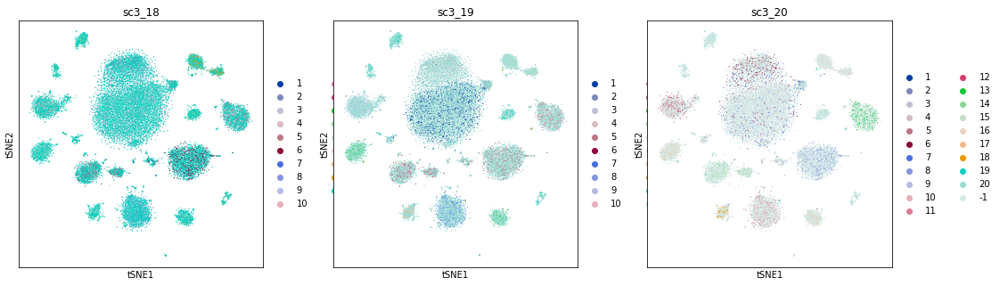

In [28]:
figsize(5,5)
sc.pl.tsne(ad, color=['sc3_18','sc3_19','sc3_20'])

... storing 'sc3_18' as categorical


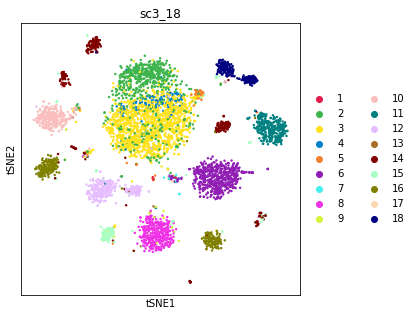

In [29]:
ad1 = ad[~ad.obs['sc3_18'].isin(['-1']),:]
ad1.obs['sc3_18'] = ad1.obs['sc3_18'].astype(float).astype(int).astype(str)
ad1.uns['sc3_18_colors'] = color_long
figsize(5,5)
sc.pl.tsne(ad1, color=['sc3_18'])

... storing 'sc3_19' as categorical


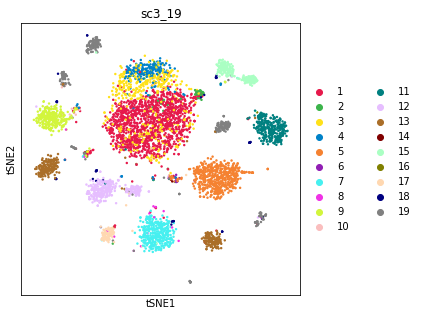

In [30]:
ad1 = ad[~ad.obs['sc3_19'].isin(['-1']),:]
ad1.obs['sc3_19'] = ad1.obs['sc3_19'].astype(float).astype(int).astype(str)
ad1.uns['sc3_19_colors'] = color_long
figsize(5,5)
sc.pl.tsne(ad1, color=['sc3_19'])

... storing 'sc3_20' as categorical


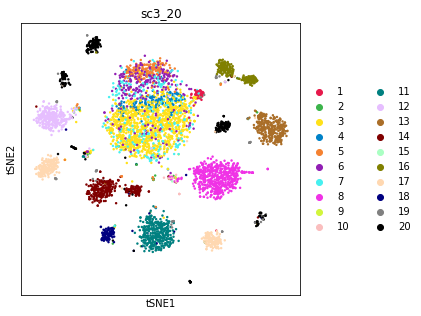

In [31]:
ad1 = ad[~ad.obs['sc3_20'].isin(['-1']),:]
ad1.obs['sc3_20'] = ad1.obs['sc3_20'].astype(float).astype(int).astype(str)
ad1.uns['sc3_20_colors'] = color_long
figsize(5,5)
sc.pl.tsne(ad1, color=['sc3_20'])

In [32]:
df = pd.read_csv("../SCCAF_example/CLS.csv", sep =' ')

In [33]:
df.head()

,com.km,com.graph,com.hc,com.hc.names,com.db
Bipolar1_CCCACAAGACTA,7,56,4,6,0
Bipolar1_TCGCCTCGTAAG,16,43,9,11,0
Bipolar1_CAAAGCATTTGC,17,41,9,11,0
Bipolar1_CTTTTGATTGAC,1,7,7,5,31
Bipolar1_GCTCCAATGACA,17,3,1,8,25


In [34]:
ad.obs['k-means'] = df['com.km'].astype(str)
ad.obs['graph_clustering'] = df['com.graph'].astype(str)
ad.obs['hcluster'] = df['com.hc'].astype(str)
ad.obs['hcluster.name'] = df['com.hc.names'].astype(str)
ad.obs['dbscan'] = df['com.db'].astype(str)

In [35]:
ad.uns['k-means_colors'] = default_64
ad.uns['graph_clustering_colors'] = default_64
ad.uns['hcluster_colors'] = default_64
ad.uns['dbscan_colors'] = default_64

saving figure to file ./figures/tsne_FigS11_colorbar.pdf


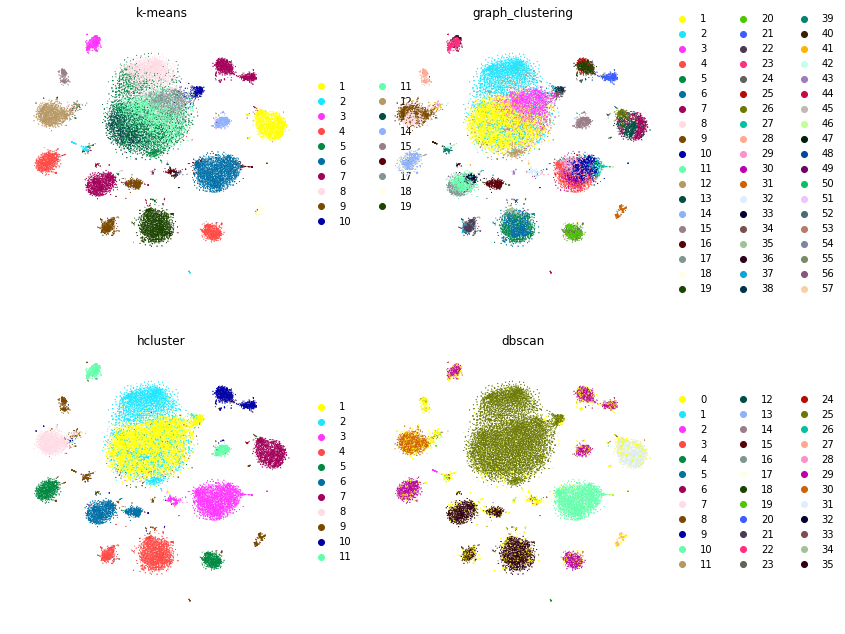

In [37]:
figsize(5,5)
sc.pl.tsne(ad, color=['k-means','graph_clustering','hcluster','dbscan'], ncols=2, frameon=False,save='_FigS11_colorbar.pdf')

saving figure to file ./figures/tsne_FigS11a.pdf


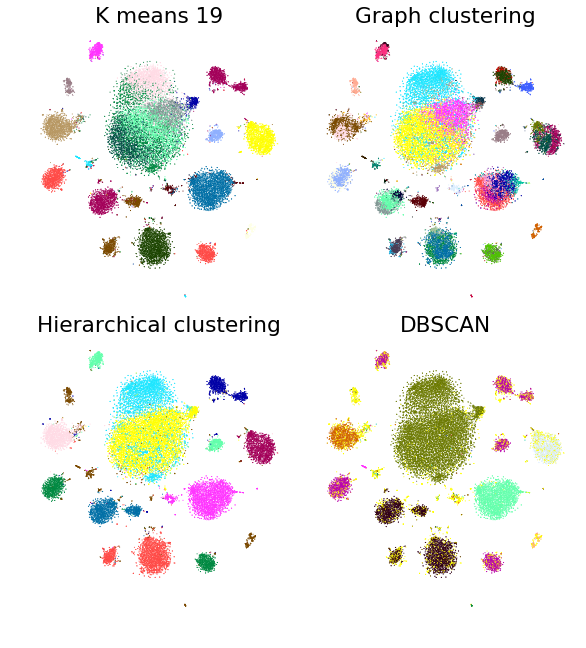

In [47]:
figsize(5,5)
matplotlib.rcParams.update({'font.size': 18})
sc.pl.tsne(ad, color=['k-means','graph_clustering','hcluster','dbscan'], \
           ncols=2, frameon=False, legend_loc='best',hspace=0.1,wspace=0,\
           title=['K means 19', 'Graph clustering','Hierarchical clustering','DBSCAN'], save='_FigS11a.pdf')

# End